In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import matplotlib as mpl
import warnings 
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
%matplotlib inline

In [2]:
## read a CSV file 
df1 = pd.read_csv("cleandata.csv")

In [3]:
df1.columns

Index(['Course', 'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nationality',
       'Mother's qualification', 'Father's qualification',
       'Mother's occupation', 'Father's occupation', 'Admission grade',
       'Displaced', 'Educational special needs', 'Tuition fees up to date',
       'Gender', 'Scholarship holder', 'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)',
       'Curricular units 2nd sem (without evaluations)', 'GDP', 'Tar

In [4]:
df1.drop([
           'Nationality',
           "Mother's qualification",
           "Curricular units 1st sem (evaluations)",
           "Mother's occupation",
           "Father's occupation",
           "Father's qualification",
           'Educational special needs',
           'Displaced',
           "GDP",
          ],axis=1,inplace=True)

In [5]:
df1.columns

Index(['Course', 'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Admission grade',
       'Tuition fees up to date', 'Gender', 'Scholarship holder',
       'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)',
       'Curricular units 2nd sem (without evaluations)', 'Target'],
      dtype='object')

(22.5, -0.5)

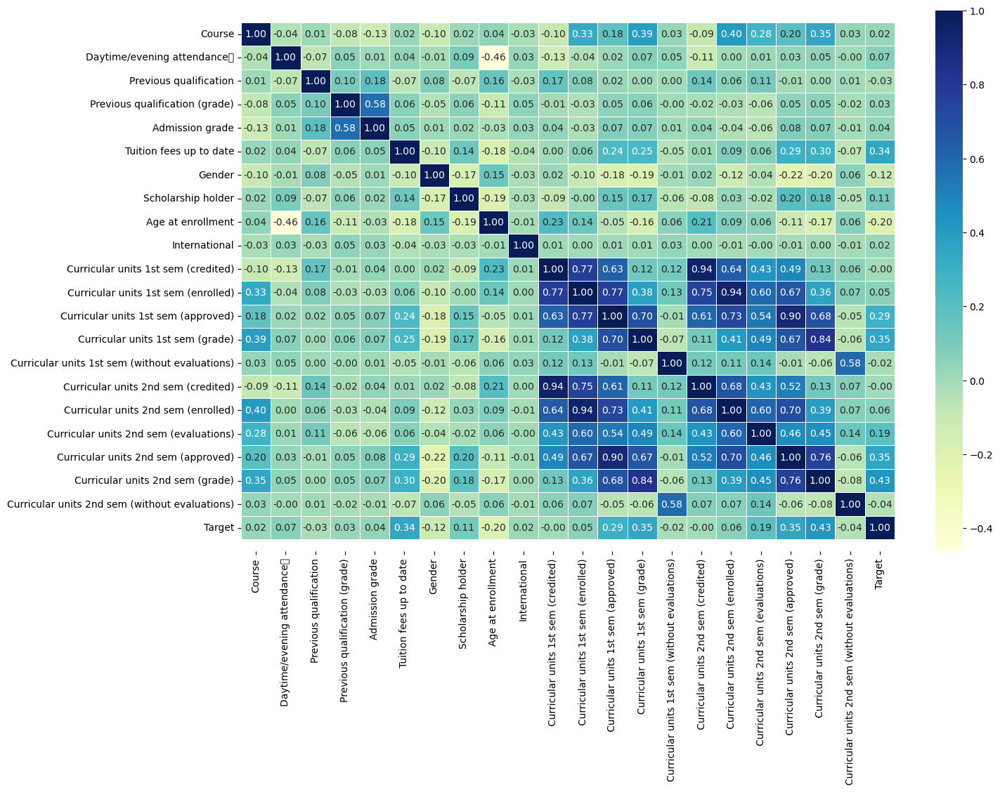

In [6]:
# Let's make our correlation matrix a little prettier
corr_matrix = df1.corr()
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="YlGnBu");
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

<AxesSubplot:>

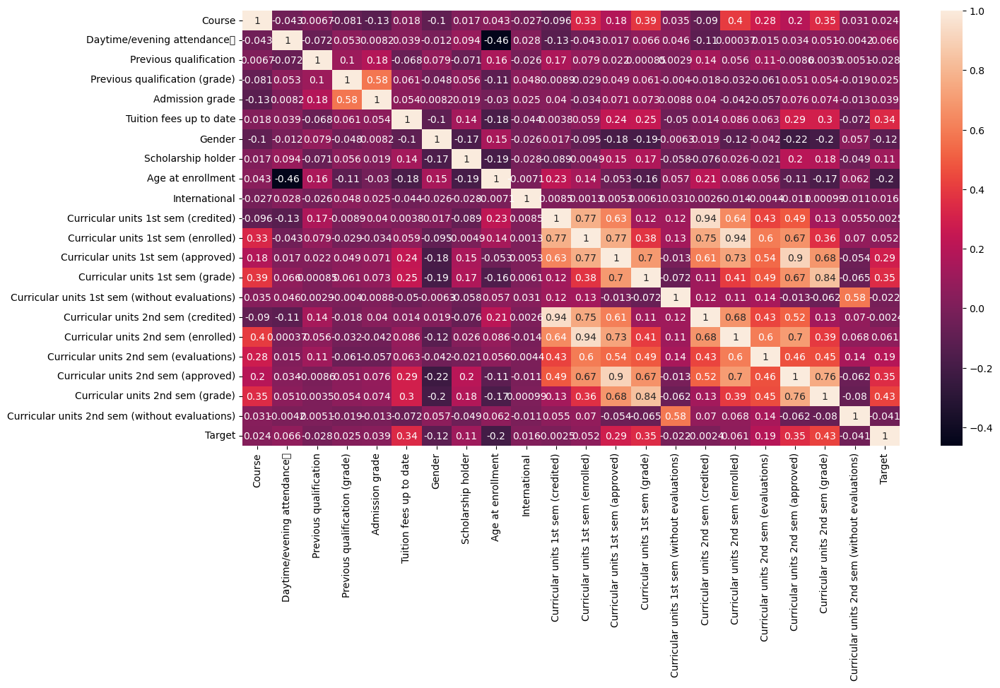

In [7]:
plt.figure(figsize=(15,8))
sns.heatmap(df1.select_dtypes(include=np.number).corr(),annot=True)

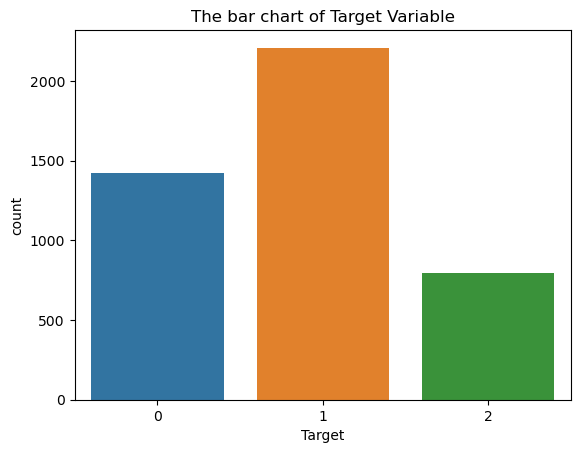

In [9]:
## creating a bar chart using Seaborn's countplot to visualize the distribution of the 'Target' variable
import seaborn as sns
sns.countplot(x='Target', data=df1)
plt.title('The bar chart of Target Variable')
plt.show()


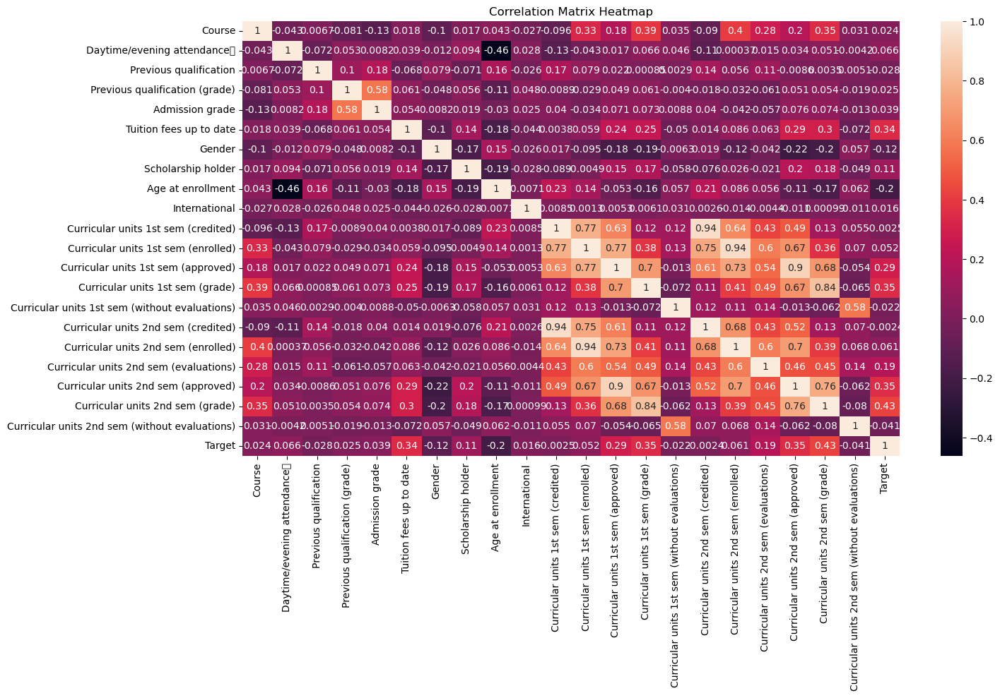

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the figure size
plt.figure(figsize=(15, 8))

# Create a heatmap using Seaborn to visualize the correlation matrix
sns.heatmap(df1.select_dtypes(include=np.number).corr(), annot=True)

# Add a title to the heatmap
plt.title('Correlation Matrix Heatmap')

# Display the plot
plt.show()


In [11]:
## read a CSV file 
df2 = pd.read_csv("data.csv")
df2.columns

Index(['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mother's qualification', 'Father's qualification',
       'Mother's occupation', 'Father's occupation', 'Admission grade',
       'Displaced', 'Educational special needs', 'Debtor',
       'Tuition fees up to date', 'Gender', 'Scholarship holder',
       'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd

In [22]:
# Demographic
demographics = df2[["Marital status", "Nacionality", "Displaced", "Gender", 
                   "Age at enrollment", "International", "Target"]]
# Academic
academic_path = df2[['Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)',
       'Curricular units 2nd sem (without evaluations)',
       'Target']]

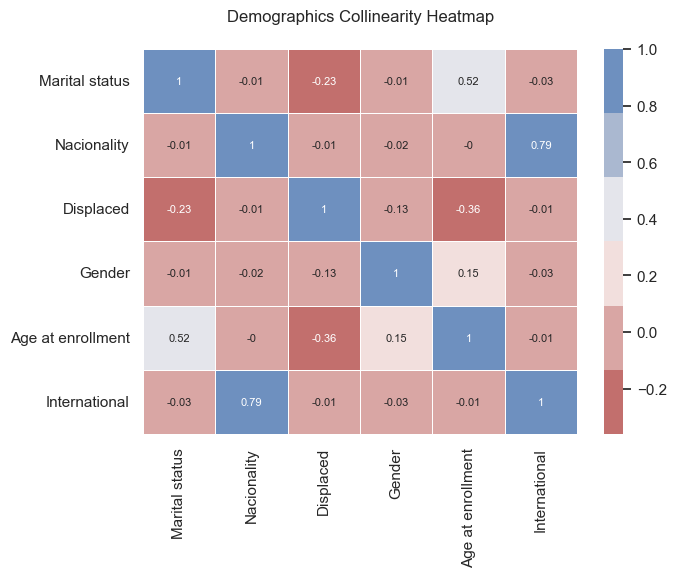

In [61]:
sns.set(rc={"figure.figsize": (7, 5)})
sns.heatmap(demographics.corr().round(2), linewidths=0.5,
            annot=True, annot_kws={"size": 8},
            cmap=sns.color_palette("vlag_r"))

plt.title('Demographics Collinearity Heatmap', pad=20)
plt.show()

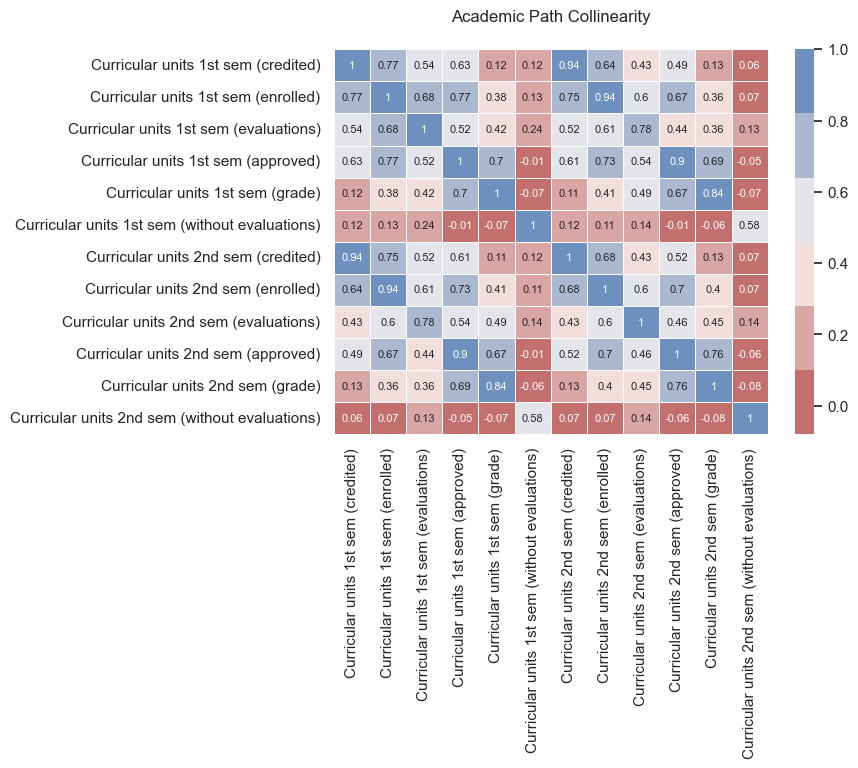

In [24]:
# Create the plot
sns.set(rc={"figure.figsize": (7, 5)})
sns.heatmap(academic_path.corr().round(2), linewidths=0.5,
            annot=True, annot_kws={"size": 8},
            cmap=sns.color_palette("vlag_r"))
# Customize the labels
plt.title('Academic Path Collinearity', pad=20)

plt.show()

in figure above, Some of these academic variables are highly correlated with each other, and some have little to no correlation with each other.

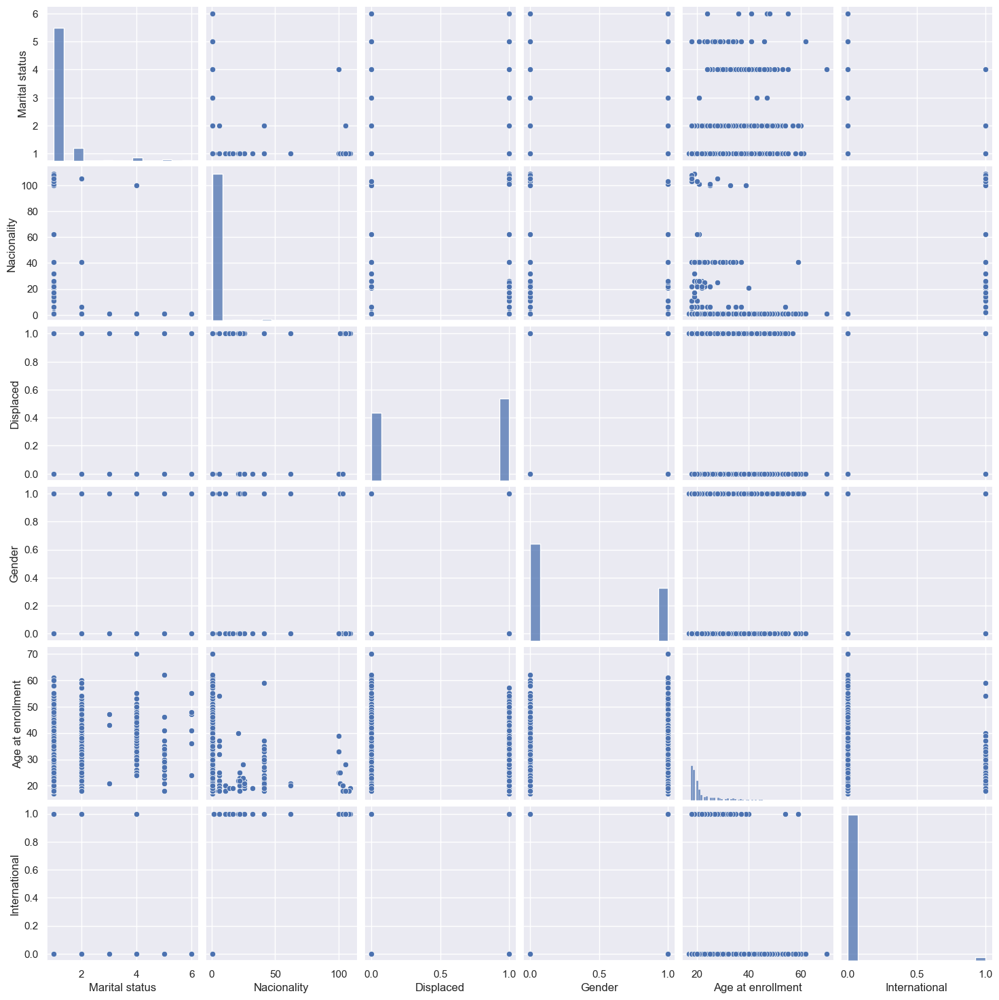

In [25]:
# Create a pair plot
sns.pairplot(demographics)

# Show the plot
plt.show()

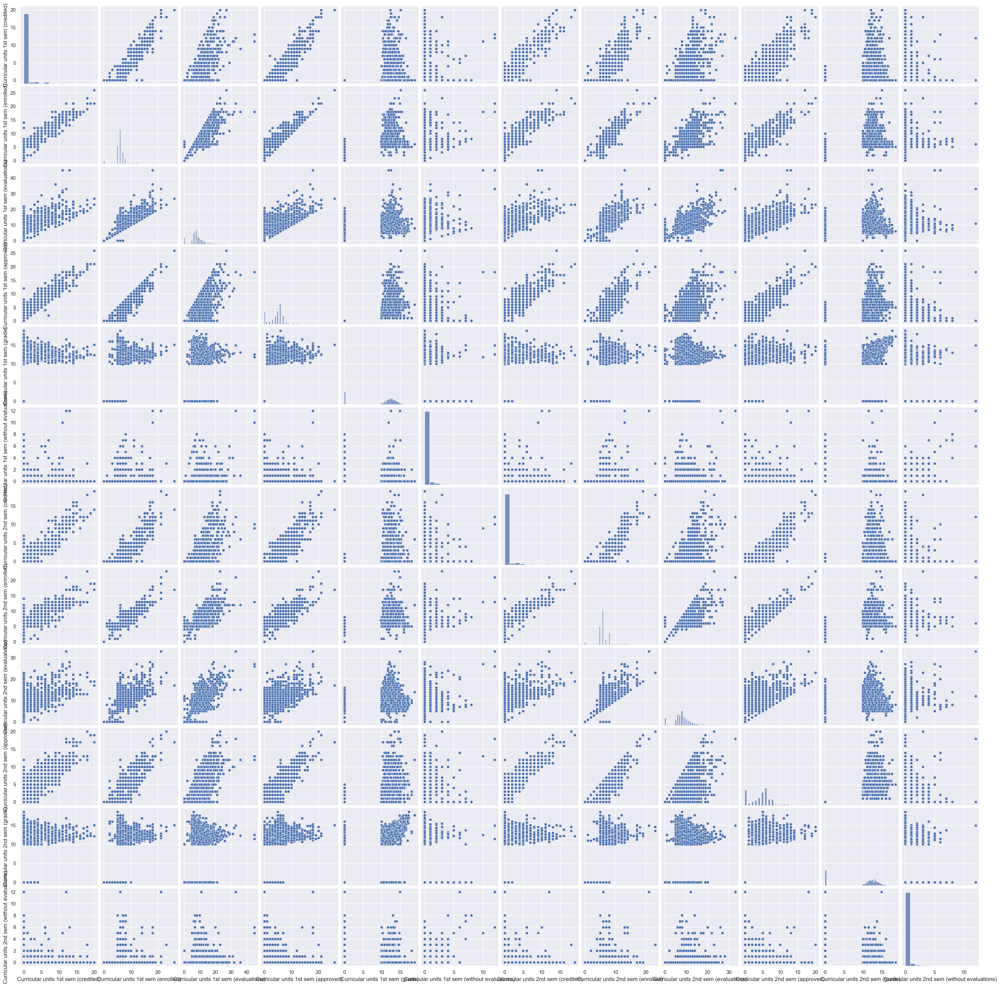

In [26]:
# Create a pair plot
sns.pairplot(academic_path)

# Show the plot
plt.show()

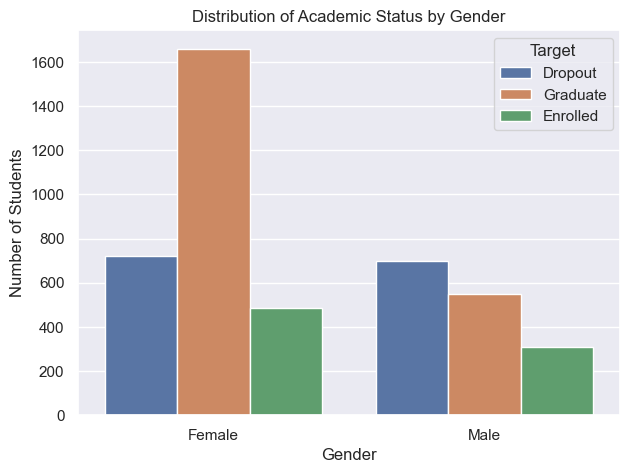

In [44]:



# Revert numerical values in the 'Target' column back to categorical labels
df3['Target'] = df3['Target'].replace({0: 'Dropout', 1: 'Graduate', 2: 'Enrolled'})

# Create a count plot to analyze the distribution of 'Target' by 'Gender'
sns.countplot(x=df3['Gender'], hue=df3['Target'])

# Customize the plot
plt.title('Distribution of Academic Status by Gender')
plt.xlabel('Gender')
plt.ylabel('Number of Students')

# Set x-axis labels
plt.xticks(ticks=[0, 1], labels=['Female', 'Male'])

# Show the plot
plt.show()


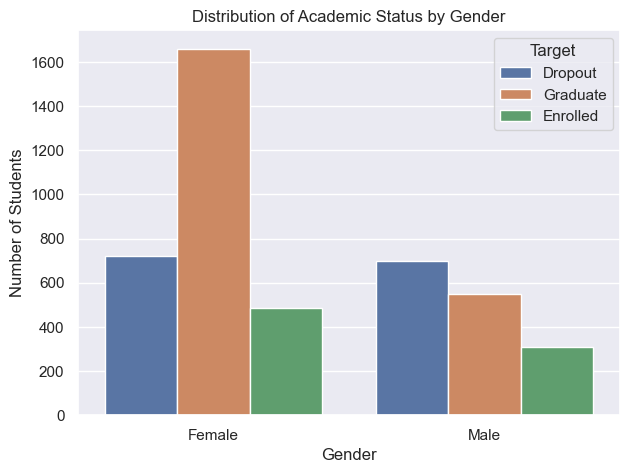

In [46]:
# Revert numerical values in the 'Target' column back to categorical labels
df3['Target'] = df1['Target'].replace({0: 'Dropout', 1: 'Graduate', 2: 'Enrolled'})

# Create a count plot to analyze the distribution of 'Target' by 'Gender'
sns.countplot(x=df3['Gender'], hue=df3['Target'])

# Customize the plot
plt.title('Distribution of Academic Status by Gender')
plt.xlabel('Gender')
plt.ylabel('Number of Students')

# Set x-axis labels
plt.xticks(ticks=[0, 1], labels=['Female', 'Male'])

# Show the plot
plt.show()

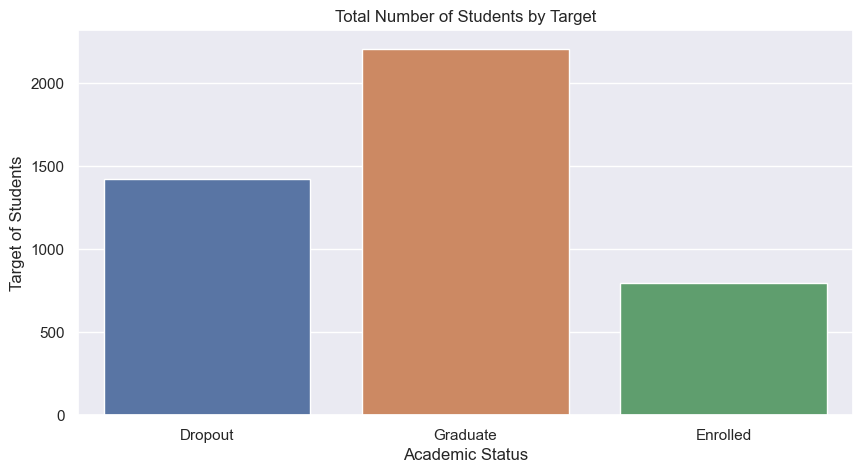

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
sns.set(rc={'figure.figsize':(10, 5)})

# Create a count plot to visualize the total number of students for each academic status
sns.countplot(x=df3['Target'])

# Customize the plot
plt.title('Total Number of Students by Target')
plt.xlabel('Academic Status')
plt.ylabel('Target of Students')

# Show the plot
plt.show()


<AxesSubplot:xlabel='Course', ylabel='count'>

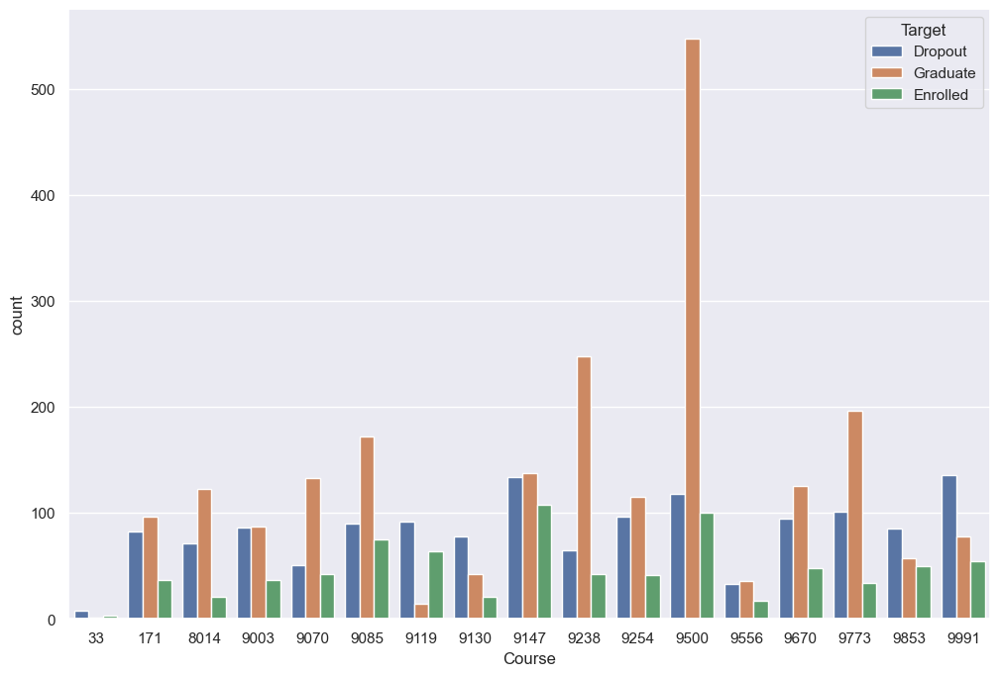

In [50]:
sns.set(rc={'figure.figsize':(12, 8)})

sns.countplot(x=df1['Course'], hue=df3['Target'])

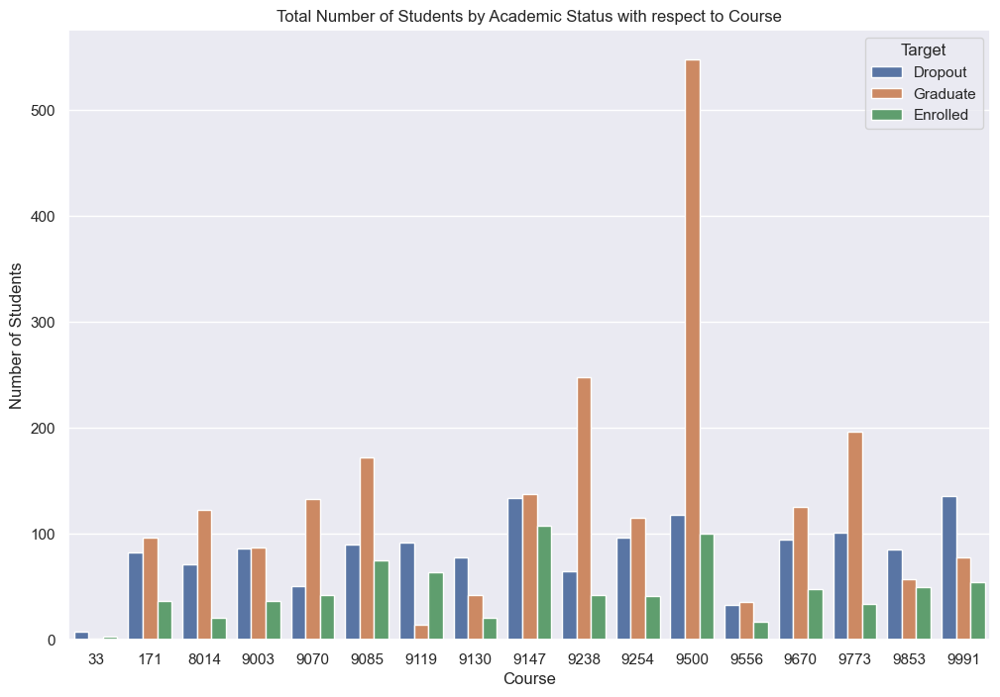

In [51]:

# Set the figure size
sns.set(rc={'figure.figsize': (12, 8)})

# Create a count plot to visualize the total number of students for each academic status with respect to 'Course'
sns.countplot(x=df1['Course'], hue=df3['Target'])

# Customize the plot
plt.title('Total Number of Students by Academic Status with respect to Course')
plt.xlabel('Course')
plt.ylabel('Number of Students')

# Show the plot
plt.show()


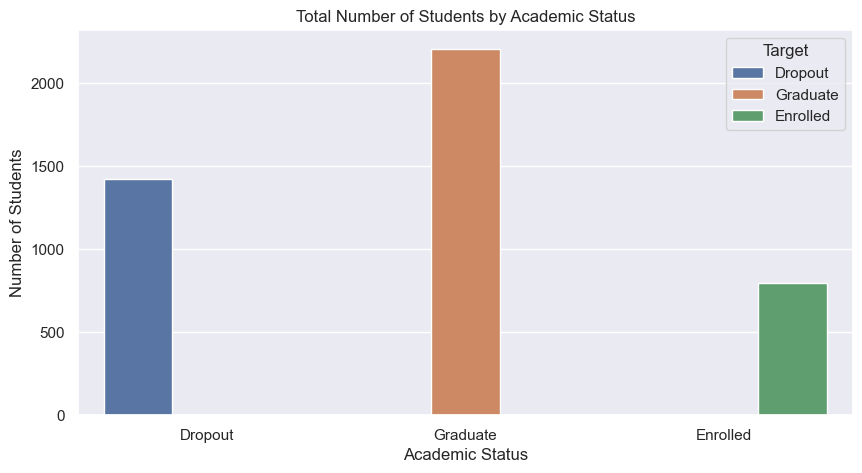

In [53]:

# Set the figure size
sns.set(rc={'figure.figsize': (10, 5)})

# Create a count plot to visualize the total number of students for each academic status
sns.countplot(x=df3['Target'], hue=df3['Target'])

# Customize the plot
plt.title('Total Number of Students by Academic Status')
plt.xlabel('Academic Status')
plt.ylabel('Number of Students')

# Show the plot
plt.show()


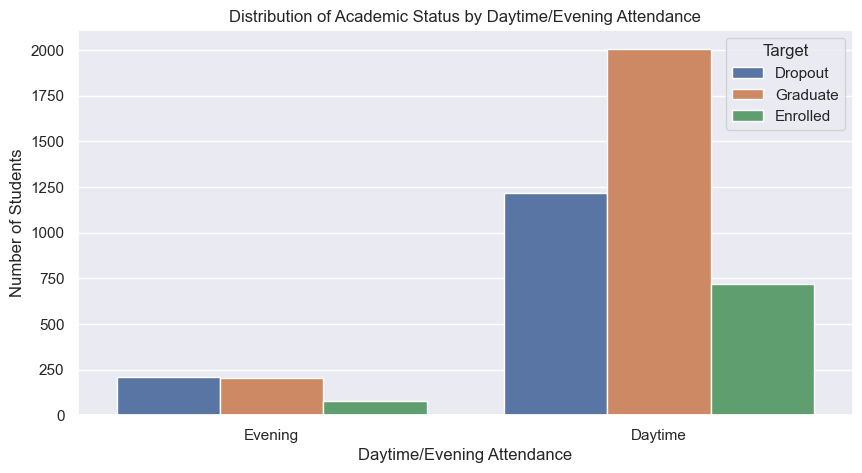

In [55]:



# Set the figure size
sns.set(rc={'figure.figsize': (10, 5)})

# Create a count plot to visualize the distribution of academic status by 'Daytime/evening attendance'
sns.countplot(x=df1['Daytime/evening attendance\t'], hue=df3['Target'])

# Customize the plot
plt.title('Distribution of Academic Status by Daytime/Evening Attendance')
plt.xlabel('Daytime/Evening Attendance')
plt.ylabel('Number of Students')

# Set x-axis labels
plt.xticks(ticks=[0, 1], labels=['Evening', 'Daytime'])

# Show the plot
plt.show()


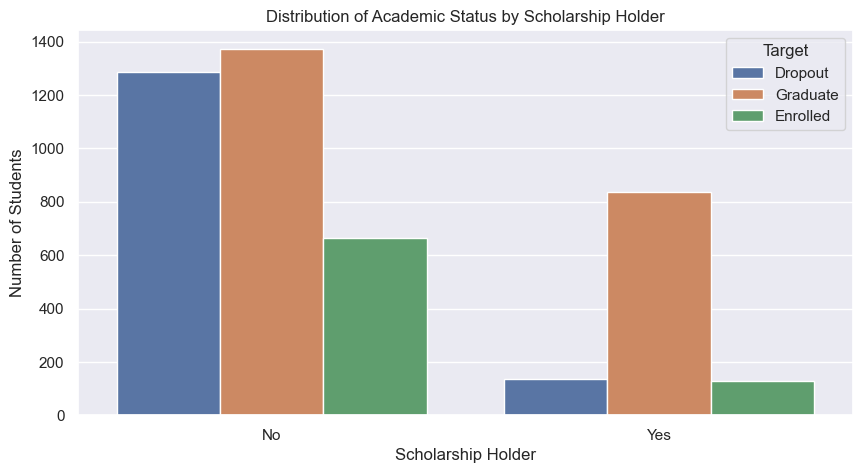

In [59]:

# Set the figure size
sns.set(rc={'figure.figsize': (10, 5)})

# Create a count plot to visualize the distribution of academic status by 'Scholarship holder'
sns.countplot(x=df1['Scholarship holder'], hue=df3['Target'])

# Customize the plot
plt.title('Distribution of Academic Status by Scholarship Holder')
plt.xlabel('Scholarship Holder')
plt.ylabel('Number of Students')

# Set x-axis labels
plt.xticks(ticks=[0, 1], labels=['No', 'Yes'])

# Show the plot
plt.show()


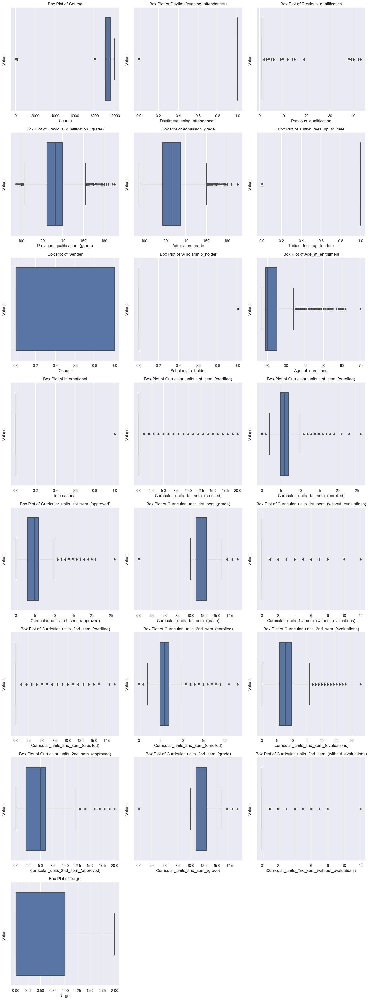

In [85]:


# Select numerical columns for the box plots
numerical_columns = df1.select_dtypes(include=['int', 'float']).columns

# Set the number of subplots based on the number of numerical columns
num_plots = len(numerical_columns)
num_rows = (num_plots // 2) + (num_plots % 2)  # Ensure an even layout

# Set the figure size
plt.figure(figsize=(15, 5 * num_rows))

# Create box plots for each numerical column
for i, column in enumerate(numerical_columns, start=1):
    plt.subplot(num_rows, 3, i)
    sns.boxplot(x=df1[column])
    plt.title(f'Box Plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Values')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


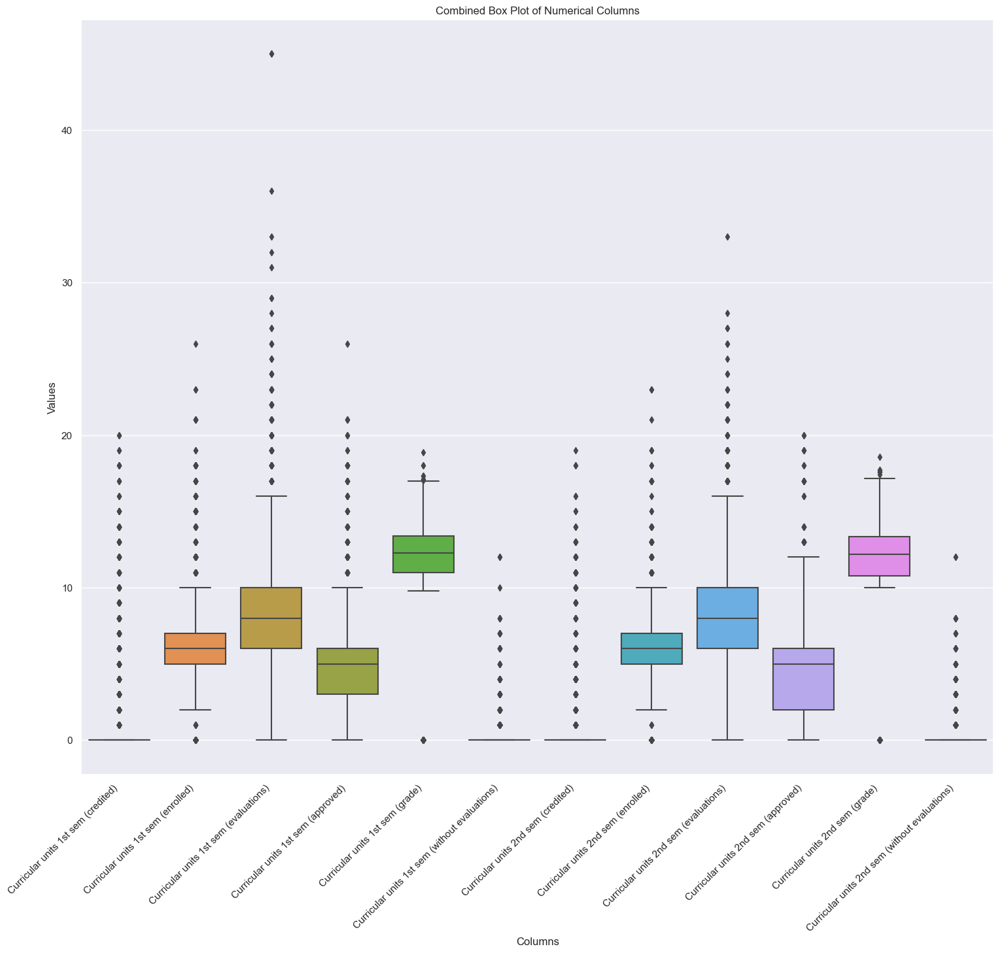

In [78]:


# Select numerical columns for the box plot
numerical_columns = academic_path.select_dtypes(include=['int', 'float']).columns

# Melt the DataFrame for Seaborn's box plot
melted_df = academic_path[numerical_columns].melt(var_name='Columns', value_name='Values')

# Set the figure size
plt.figure(figsize=(18, 15))

# Create a combined box plot using Seaborn
sns.boxplot(x='Columns', y='Values', data=melted_df)

# Add labels and title
plt.xlabel('Columns')
plt.ylabel('Values')
plt.title('Combined Box Plot of Numerical Columns')

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.show()


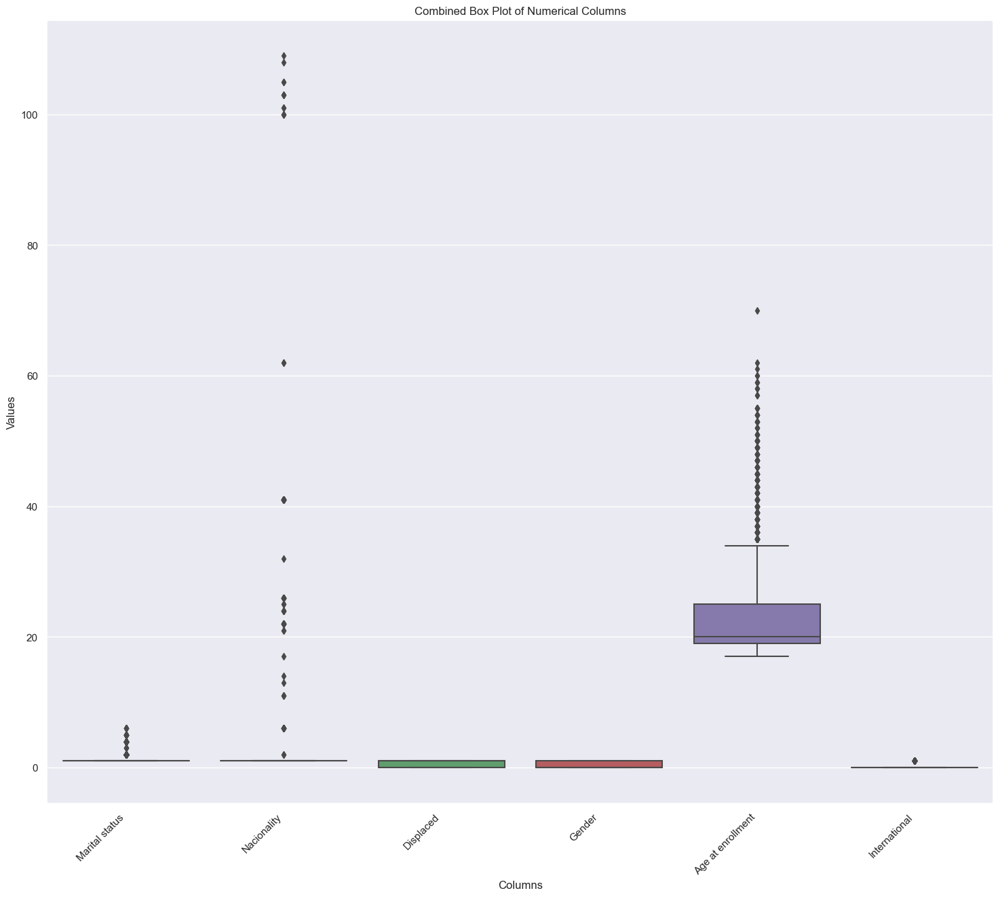

In [81]:
# Select numerical columns for the box plot
numerical_columns = demographics.select_dtypes(include=['int', 'float']).columns

# Melt the DataFrame for Seaborn's box plot
melted_df = demographics[numerical_columns].melt(var_name='Columns', value_name='Values')

# Set the figure size
plt.figure(figsize=(18, 15))

# Create a combined box plot using Seaborn
sns.boxplot(x='Columns', y='Values', data=melted_df)

# Add labels and title
plt.xlabel('Columns')
plt.ylabel('Values')
plt.title('Combined Box Plot of Numerical Columns')

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.show()


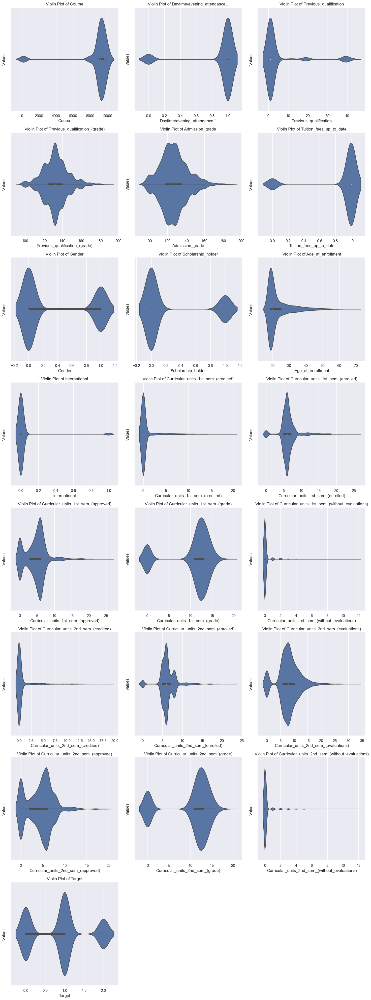

In [84]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select numerical columns for the violin plots
numerical_columns = df1.select_dtypes(include=['int', 'float']).columns

# Set the number of subplots based on the number of numerical columns
num_plots = len(numerical_columns)
num_rows = (num_plots // 2) + (num_plots % 2)  # Ensure an even layout

# Set the figure size
plt.figure(figsize=(15, 5 * num_rows))

# Create violin plots for each numerical column
for i, column in enumerate(numerical_columns, start=1):
    plt.subplot(num_rows, 3, i)
    sns.violinplot(x=df1[column])
    plt.title(f'Violin Plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Values')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


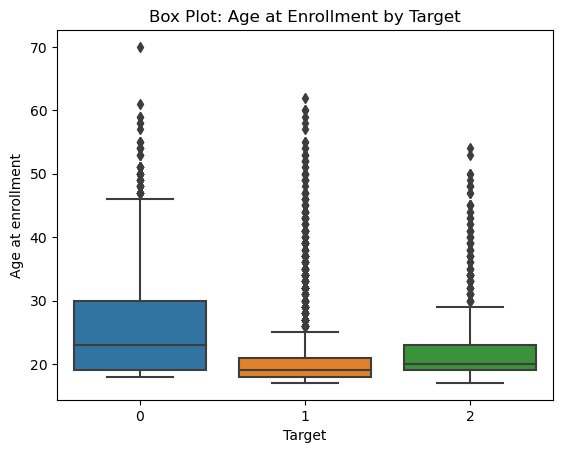

In [12]:
# Example: Comparing the distribution of 'Age at enrollment' for each 'Target' category using box plots
sns.boxplot(x='Target', y='Age at enrollment', data=df1)
plt.title('Box Plot: Age at Enrollment by Target')
plt.show()

(22.5, -0.5)

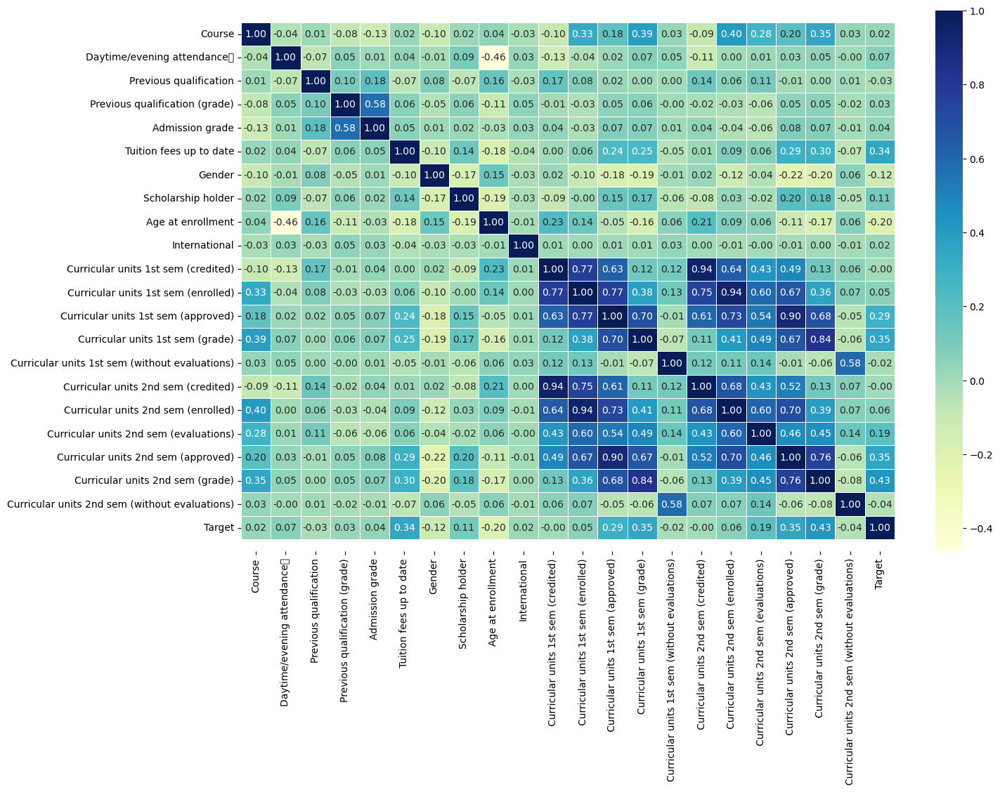

In [13]:
# Let's make our correlation matrix a little prettier
corr_matrix = df1.corr()
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="YlGnBu");
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

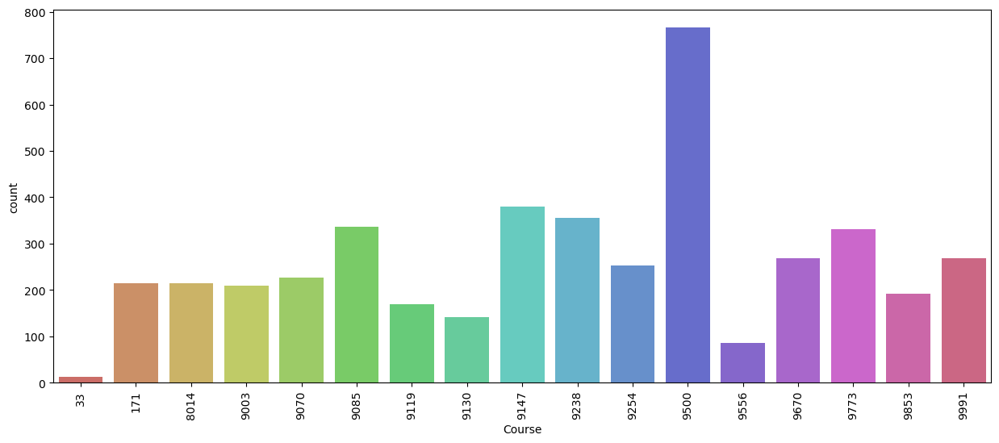

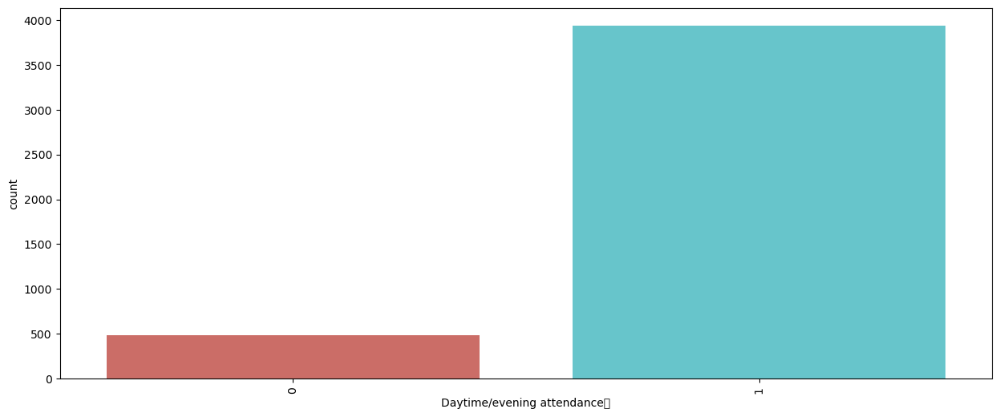

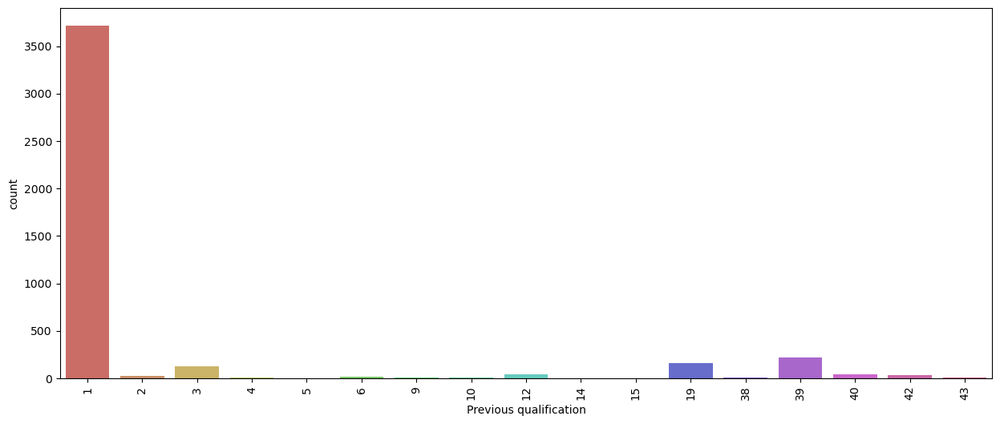

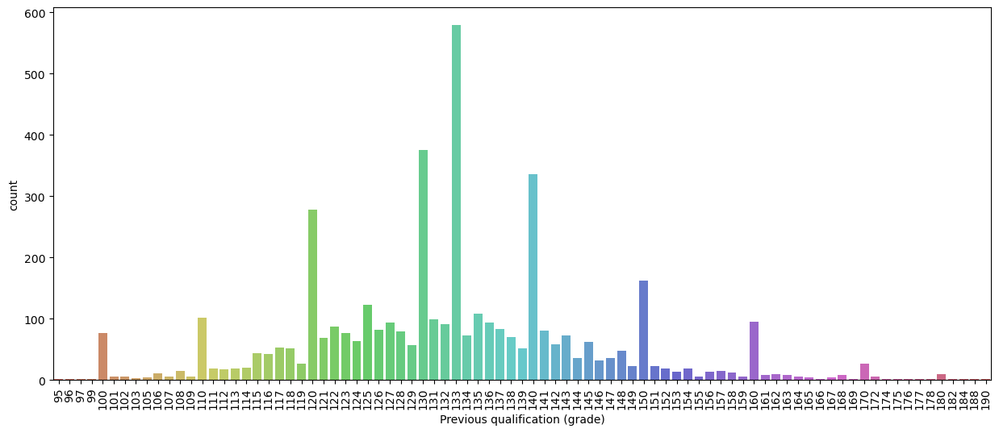

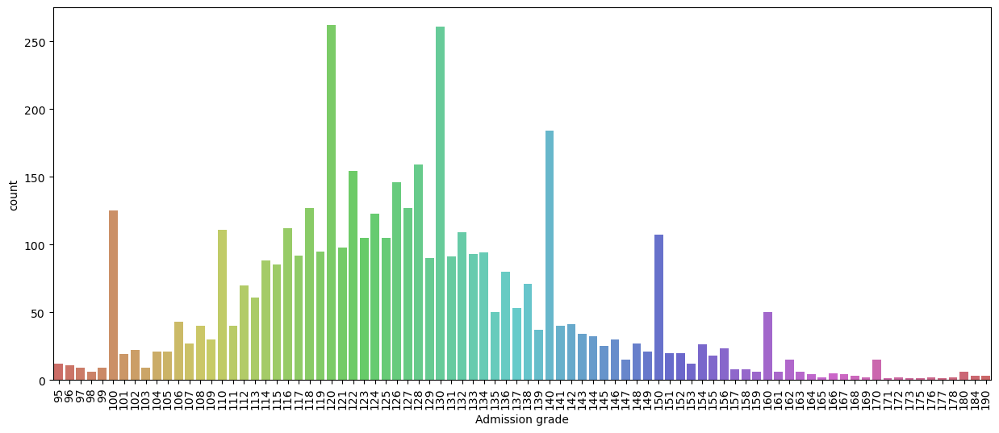

...

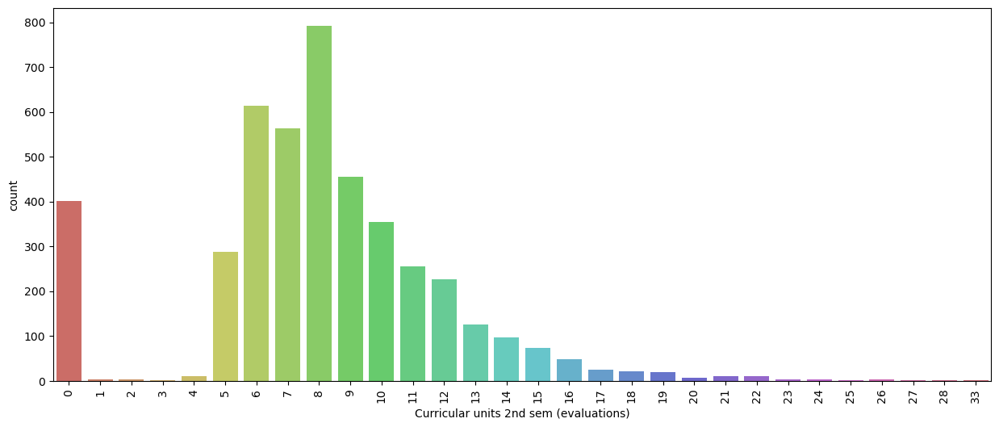

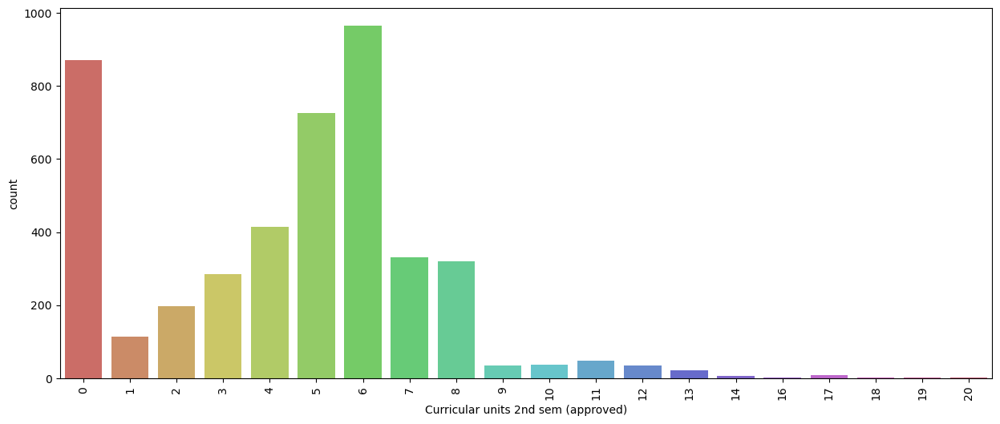

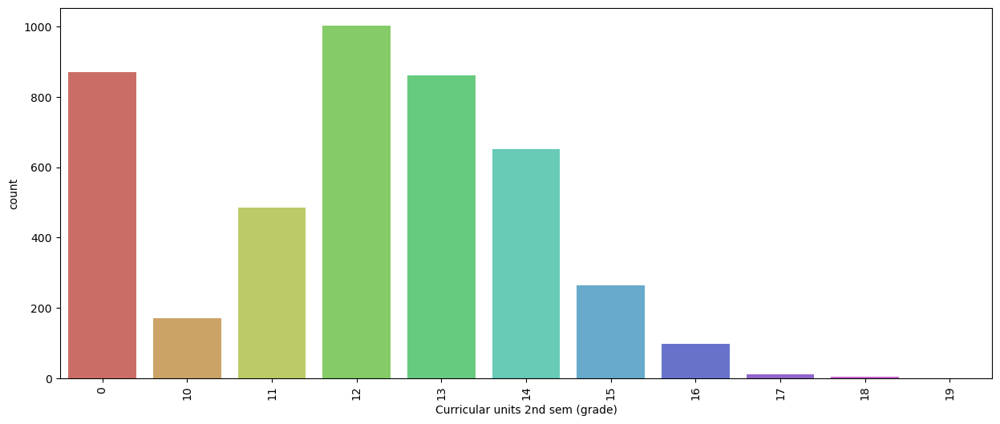

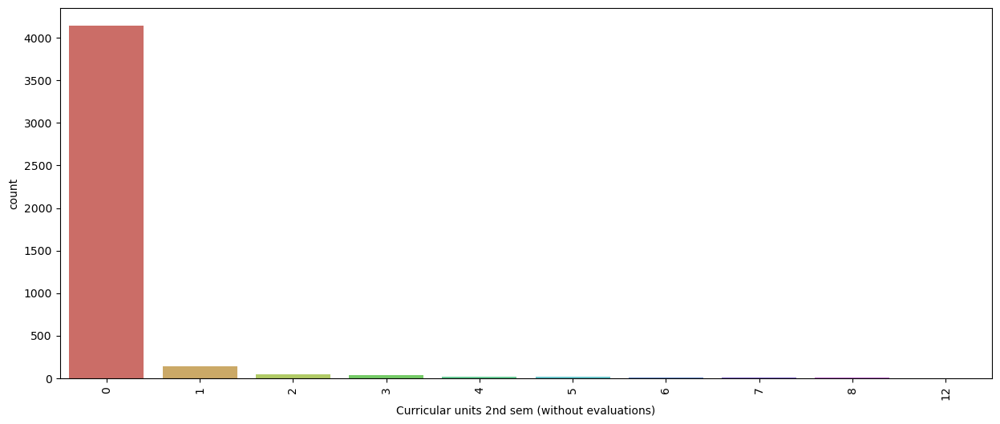

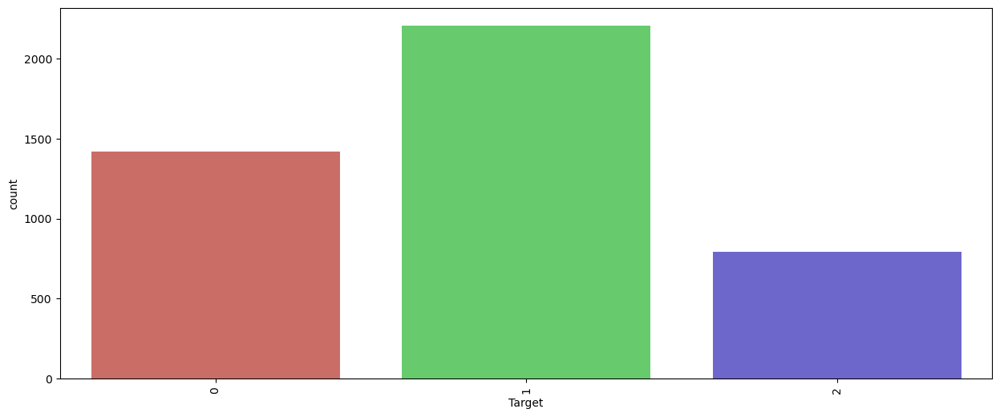

In [14]:
## create count plots for each column in DataFrame using Seaborn's countplot function
## Countplot is an effective way to visualize the distribution of categorical data in each column
for i in df1.columns:
 plt.figure(figsize=(15,6))
 sns.countplot(df1[i], data = df1, palette = 'hls')
 plt.xticks(rotation = 90)
 plt.show()

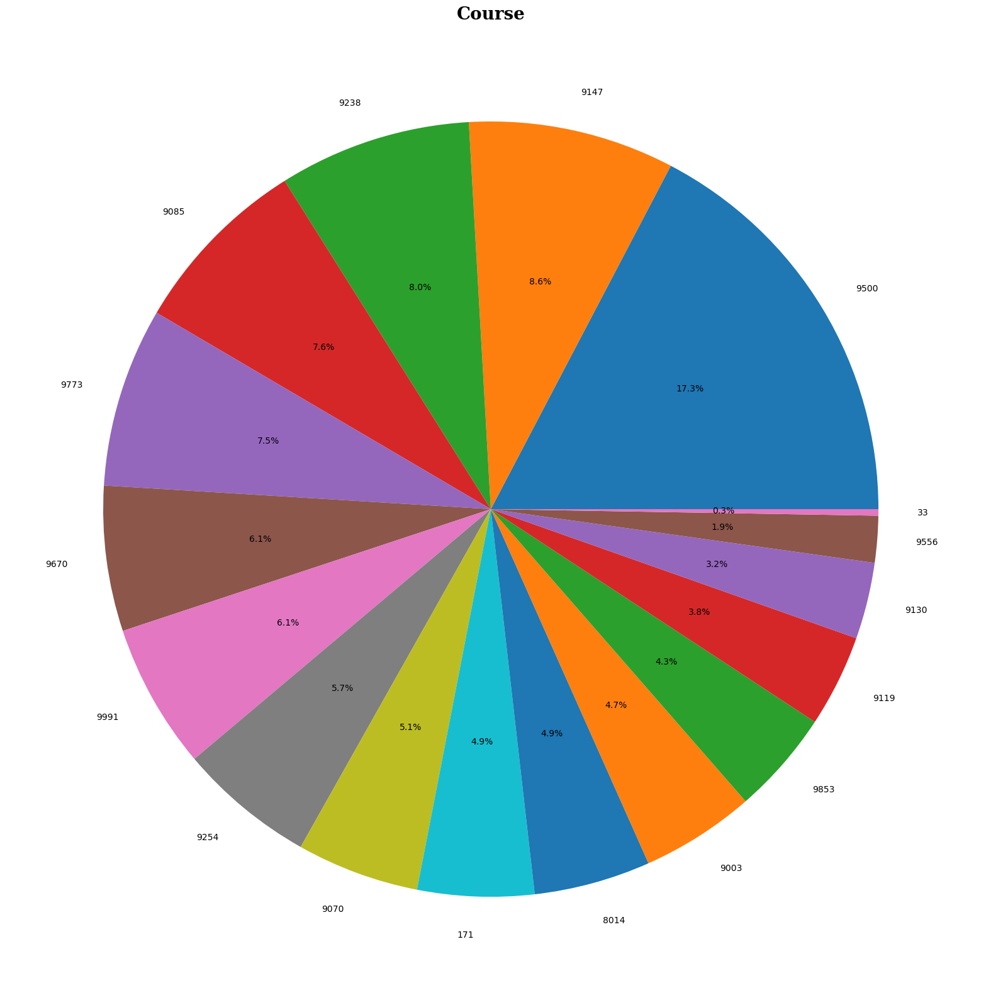

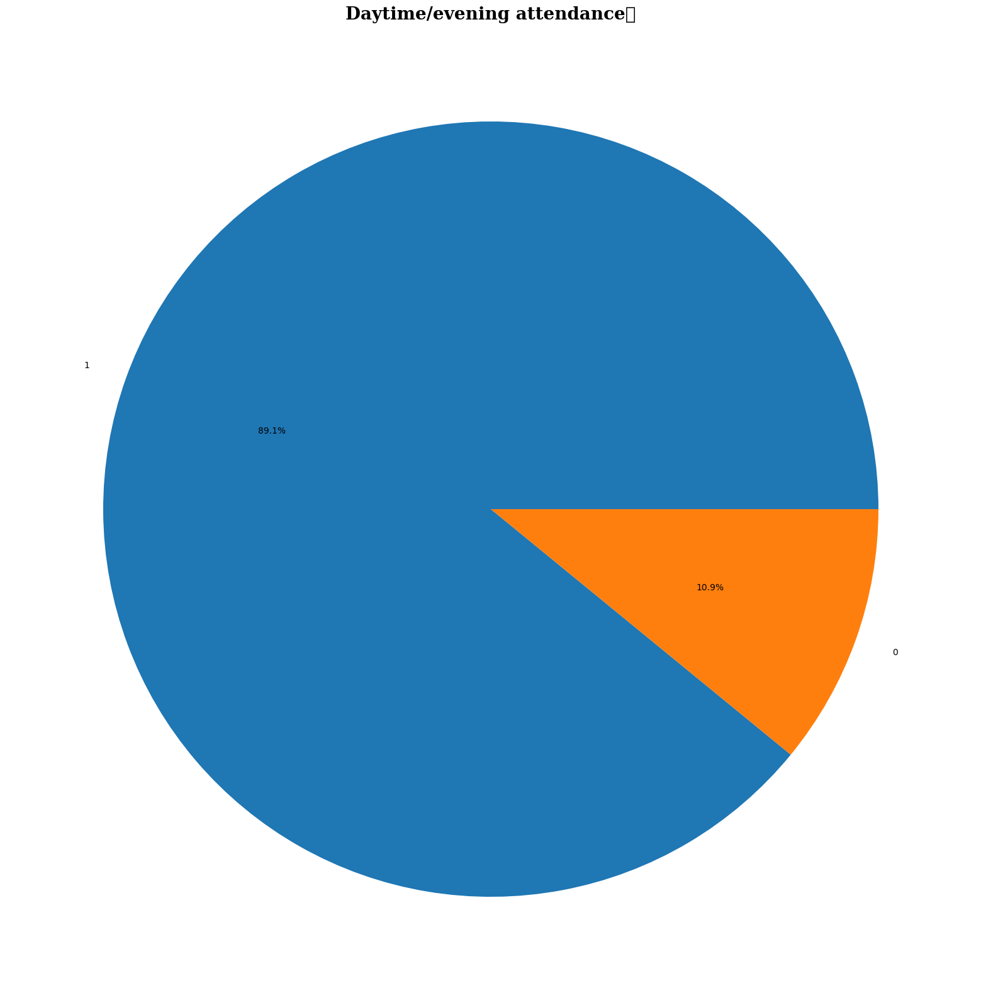

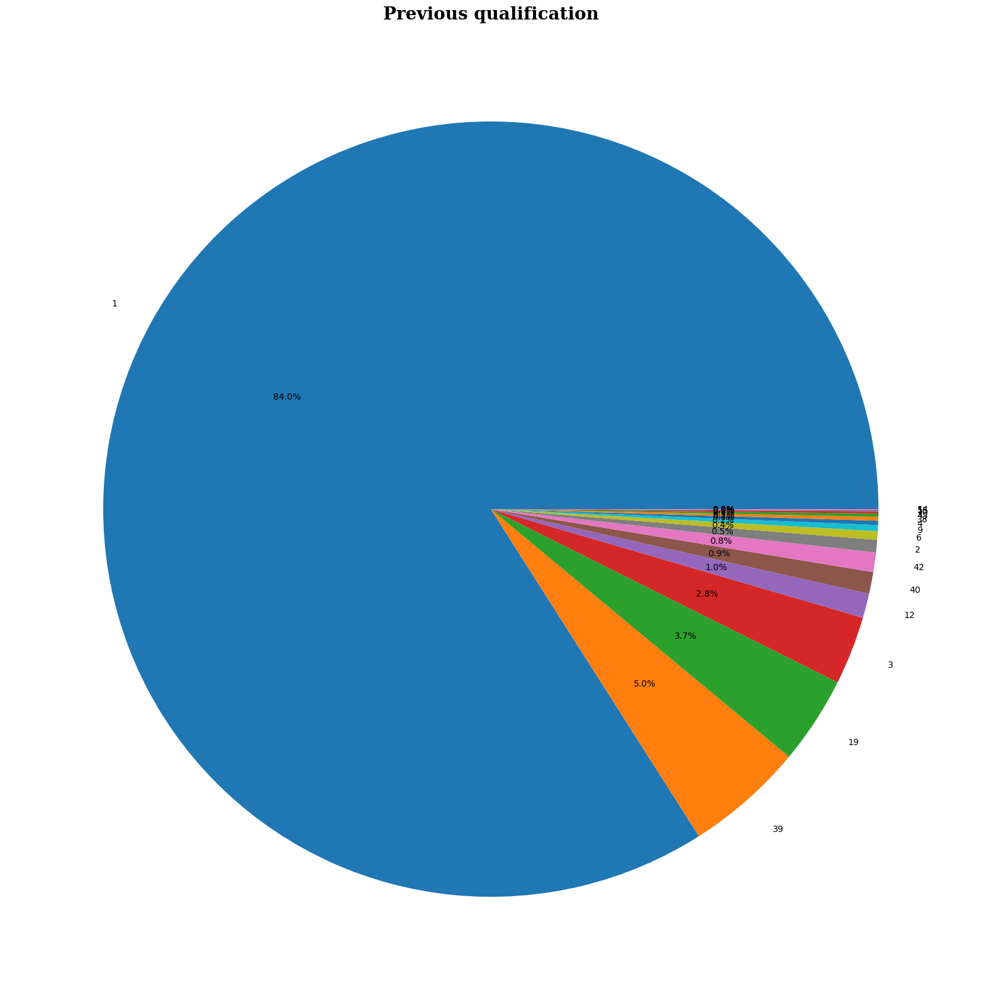

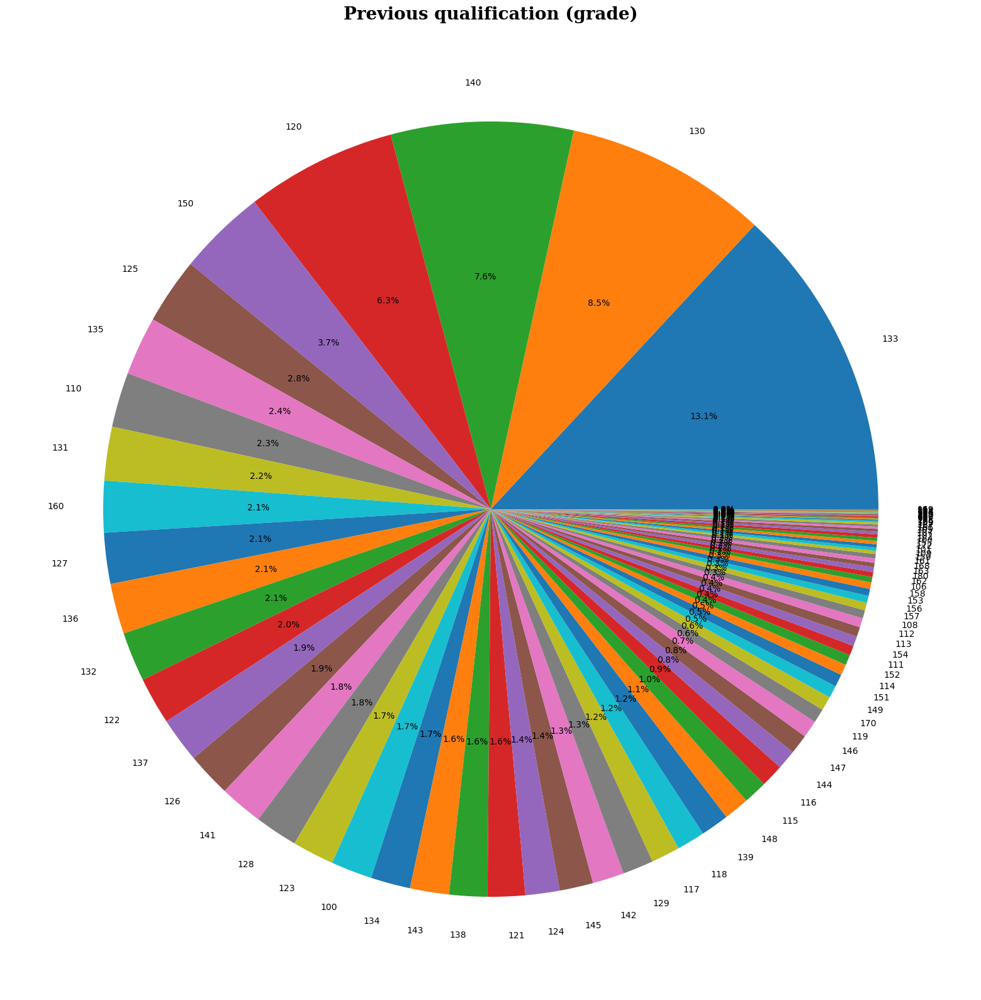

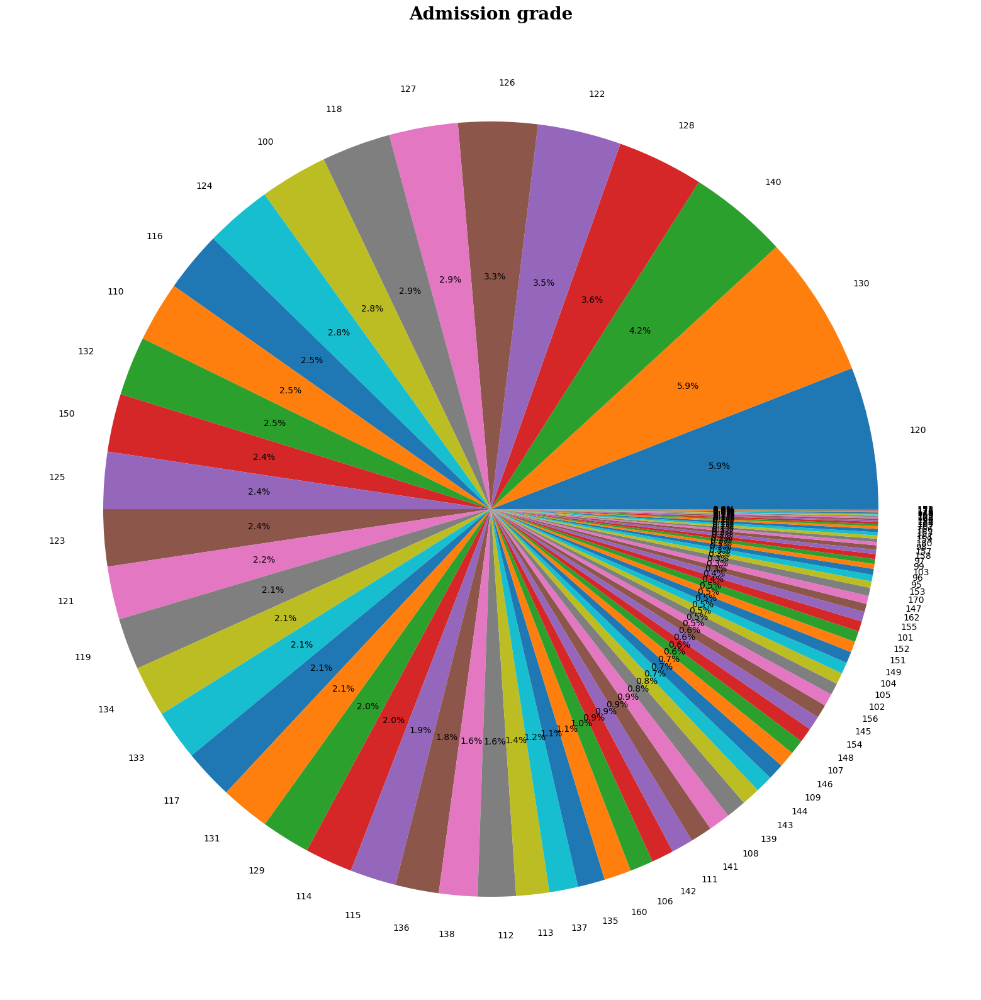

...

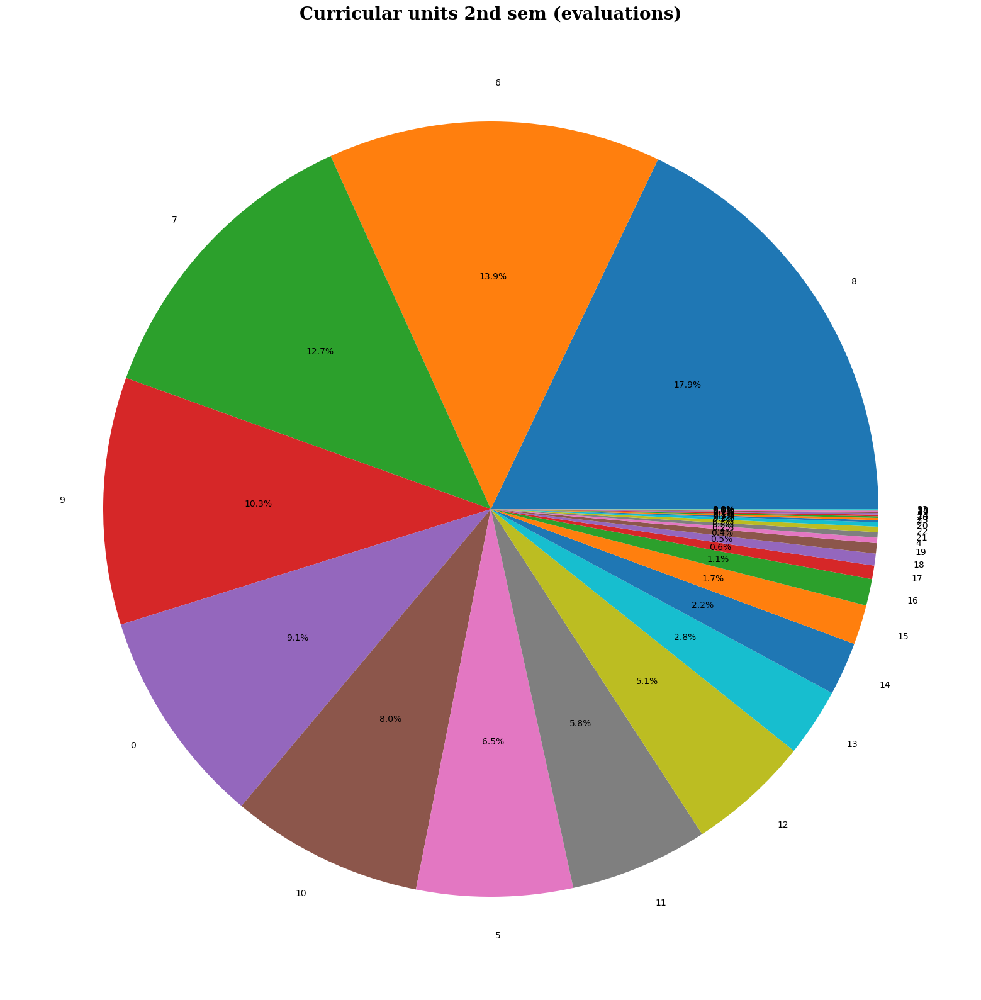

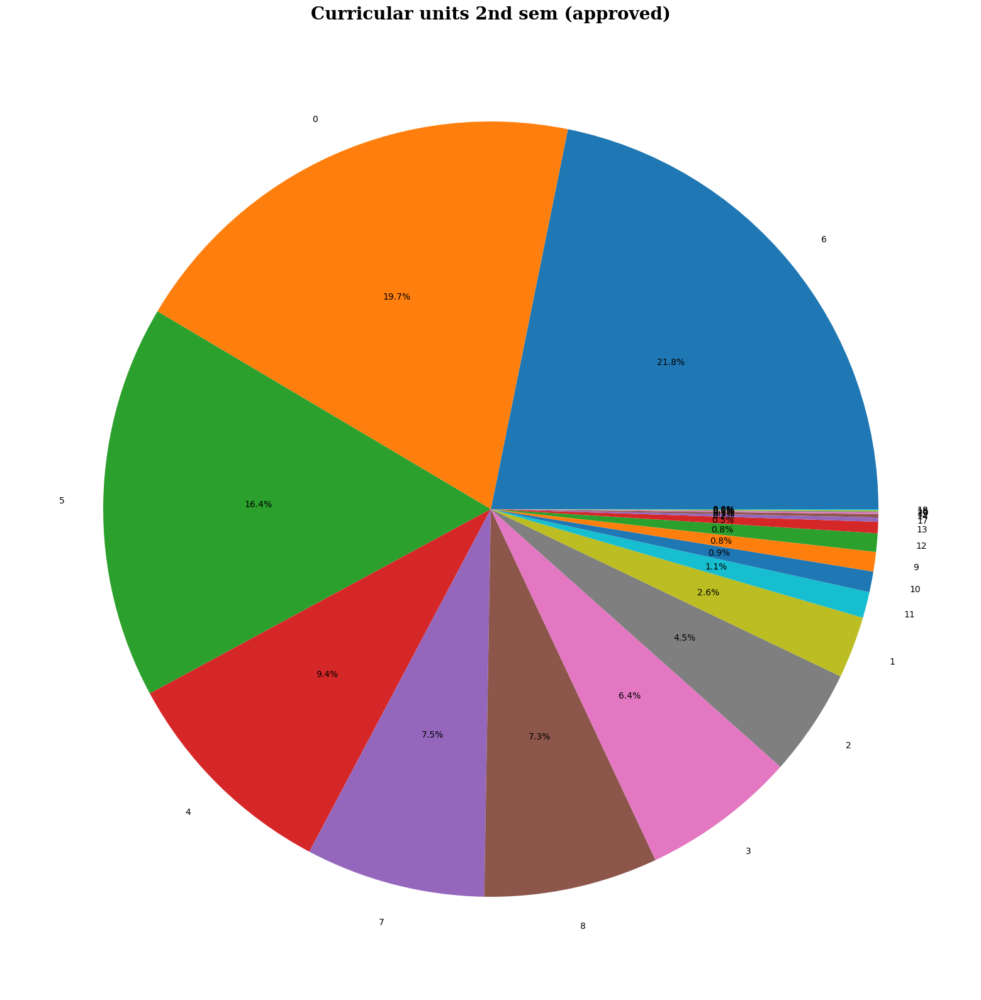

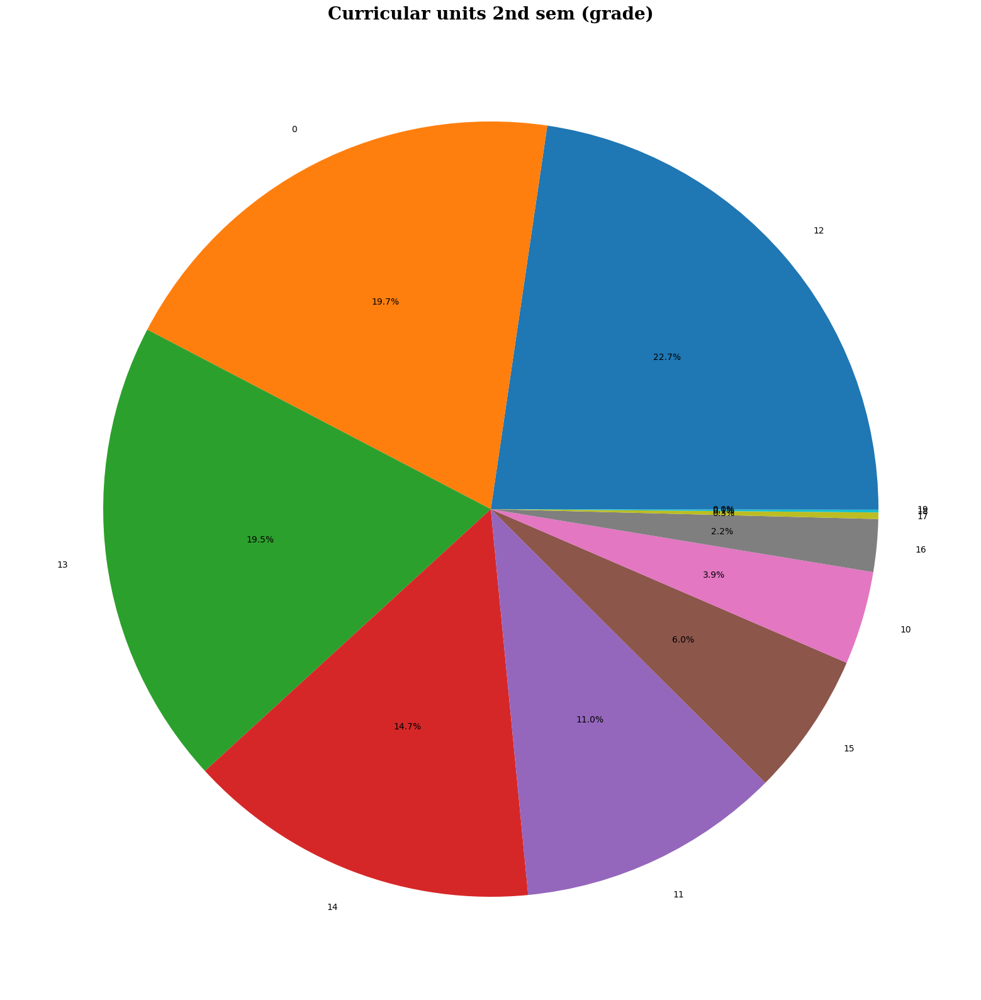

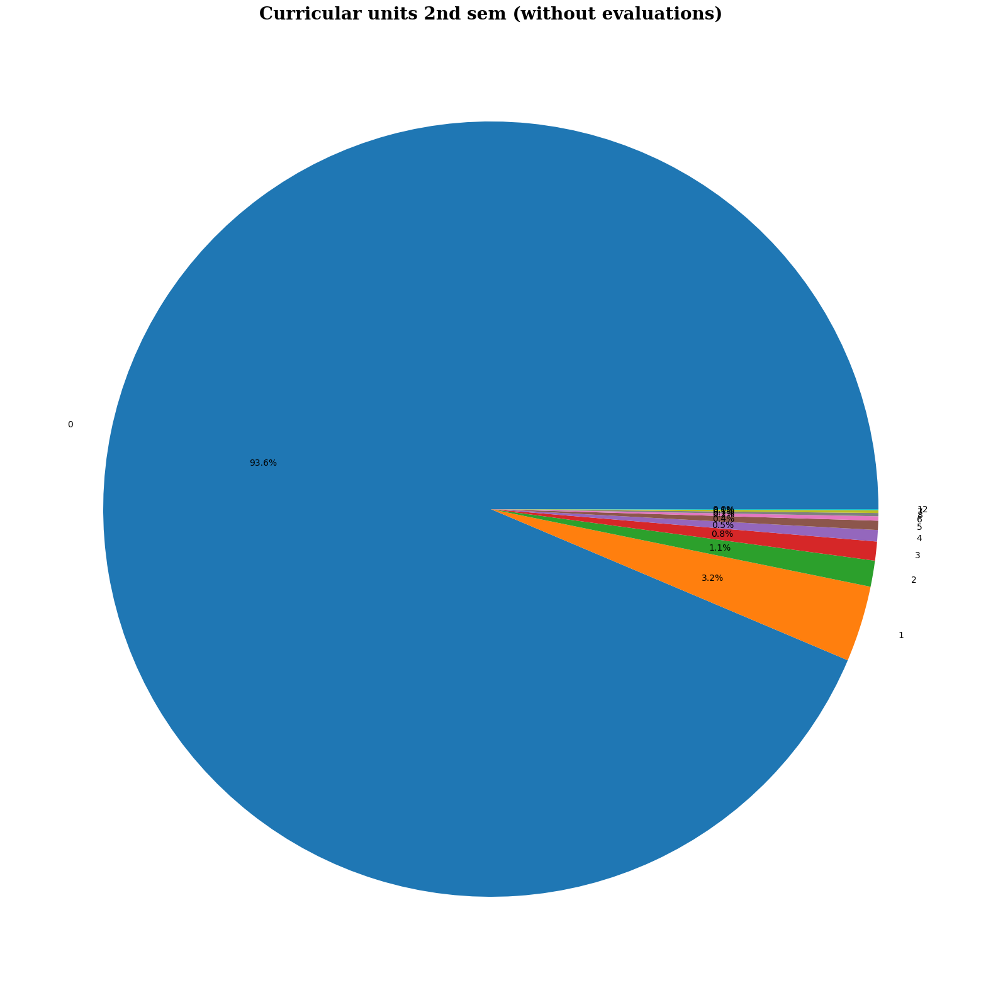

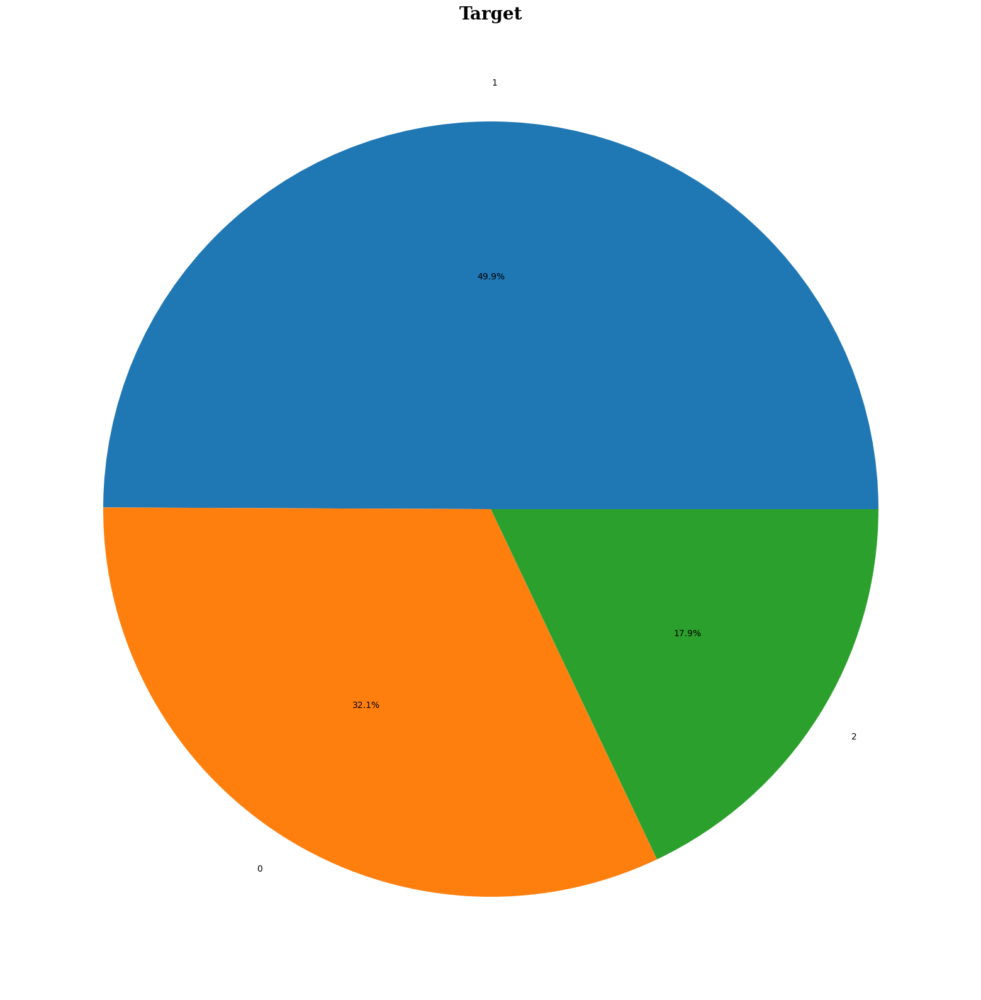

In [15]:
## Creating pie charts for each column in dataset. 
## Pie charts are a good way to represent the distribution of categorical data
for i in df1.columns:
    plt.figure(figsize=(30,20))
    plt.pie(df1[i].value_counts(), labels=df1[i].value_counts().index, autopct='%1.1f%%')
    hfont = {'fontname':'serif', 'weight': 'bold'}
    plt.title(i, size=20, **hfont)
    plt.show()

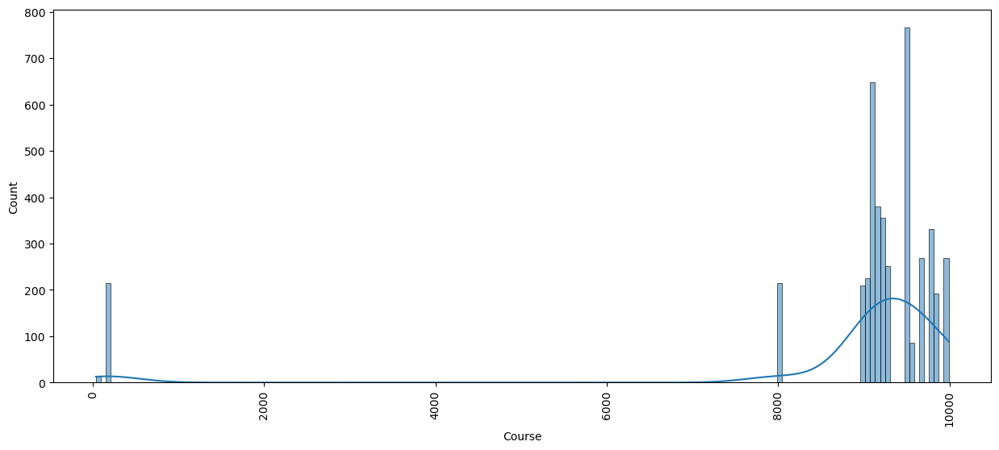

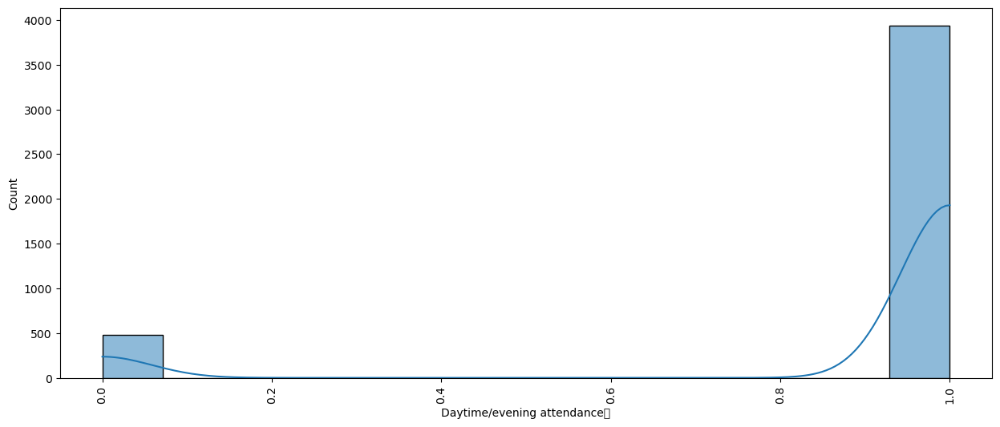

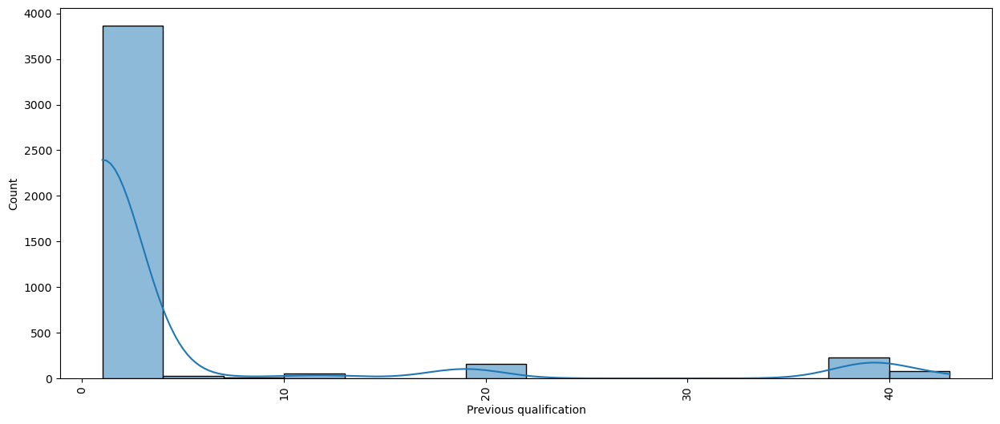

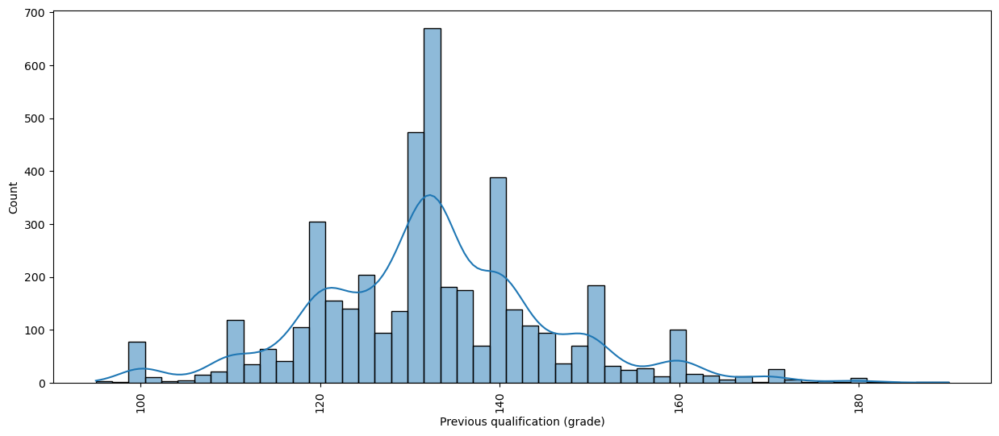

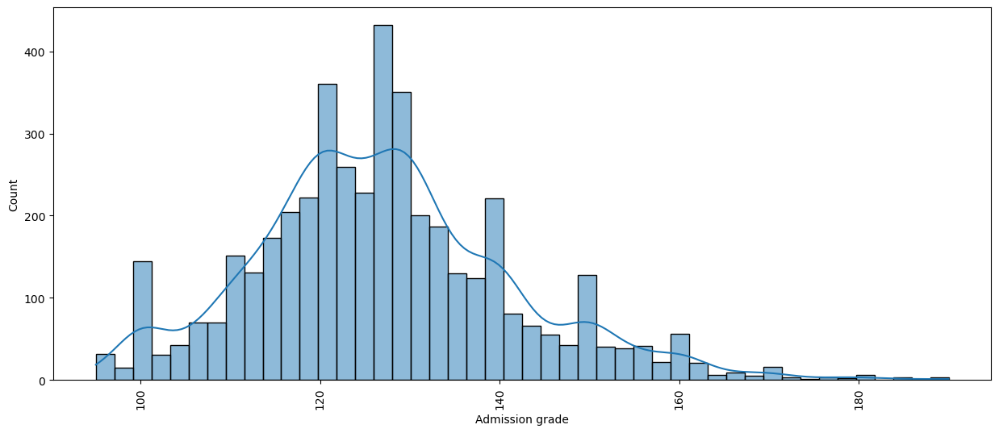

...

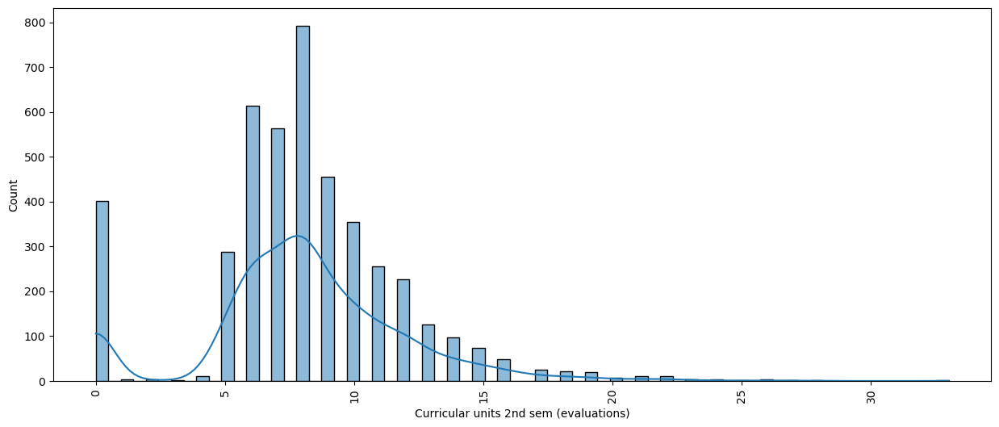

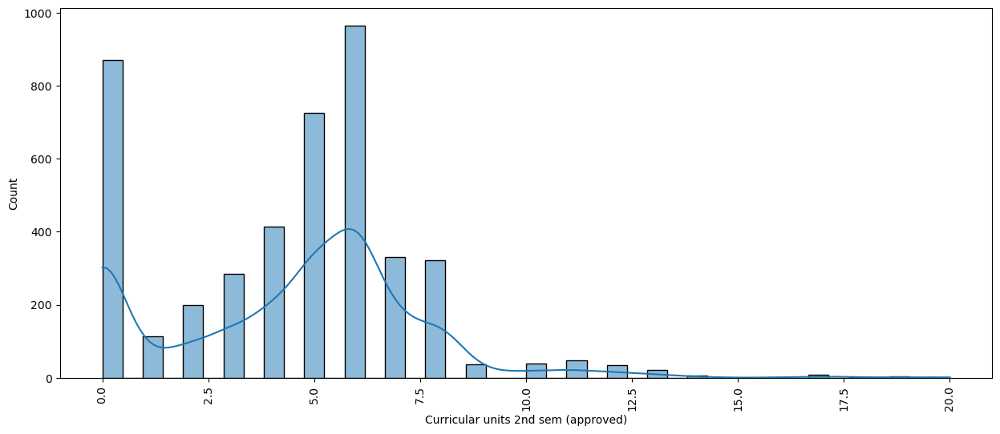

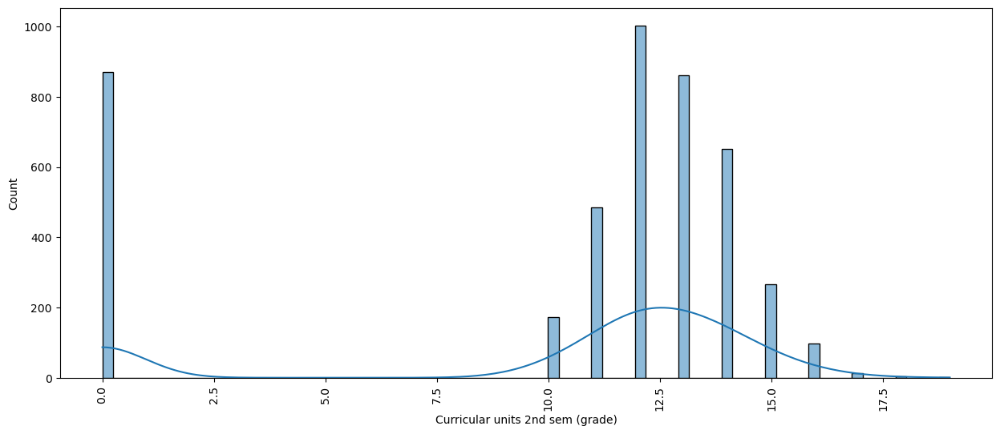

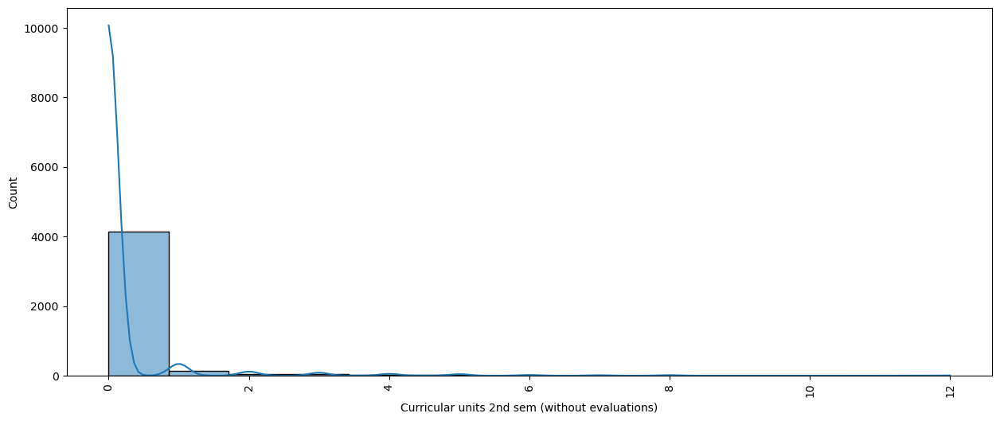

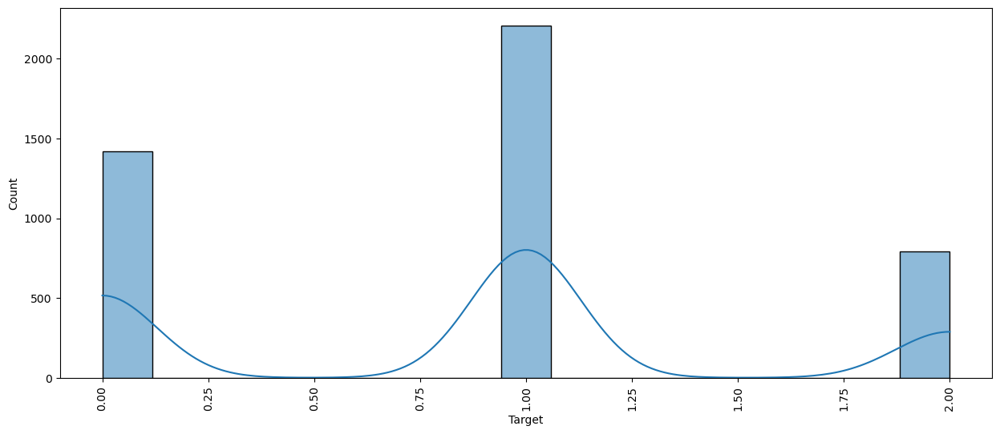

In [16]:
## Creating histograms for each column in dataset using sns.histplot.
## Histograms are a great way to visualize the distribution of numerical data.
for i in df1.columns:
    plt.figure(figsize=(15,6))
    sns.histplot(df1[i], kde = True, palette = 'hls')
    plt.xticks(rotation = 90)
    plt.show()

Index(['Course', 'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Admission grade',
       'Tuition fees up to date', 'Gender', 'Scholarship holder',
       'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd sem (grade)',
       'Curricular units 2nd sem (without evaluations)'],
      dtype='object')


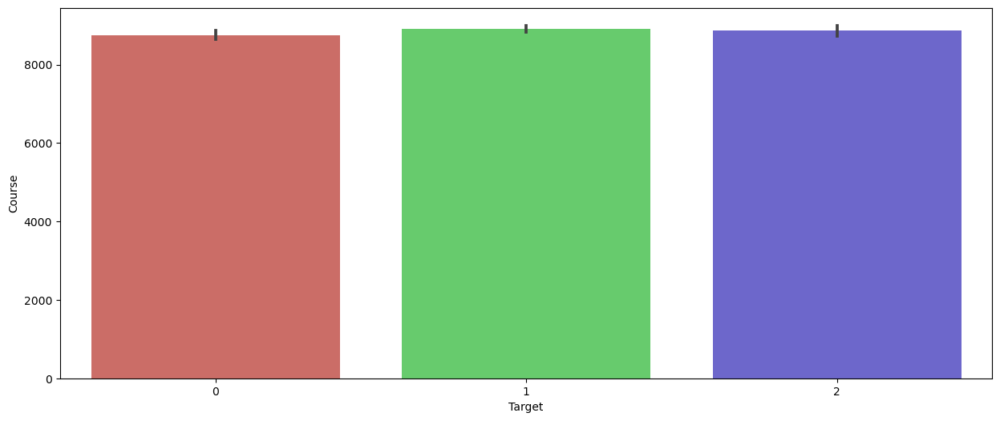

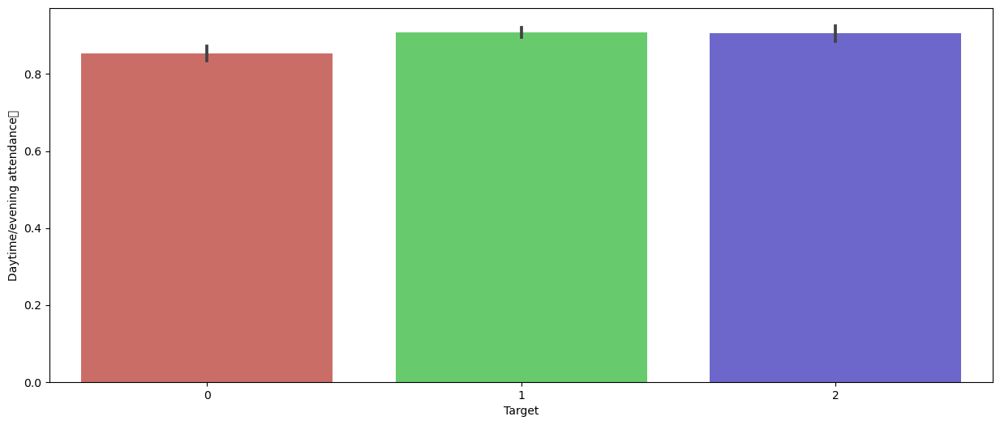

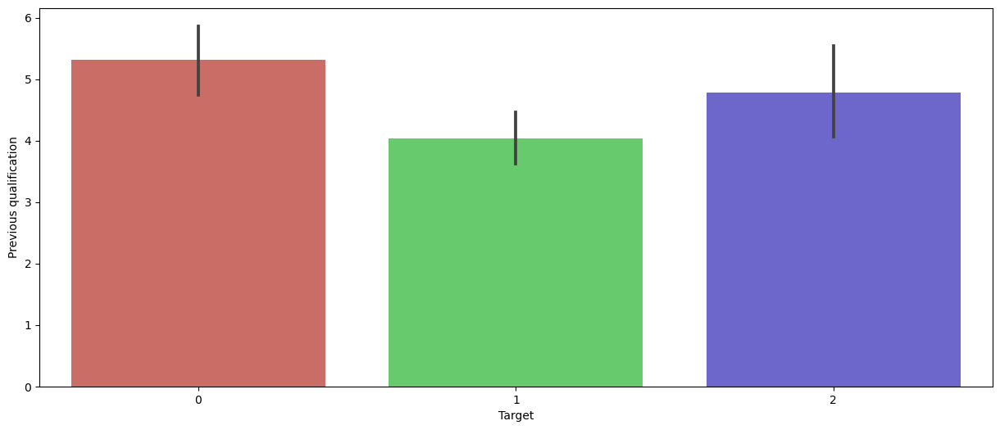

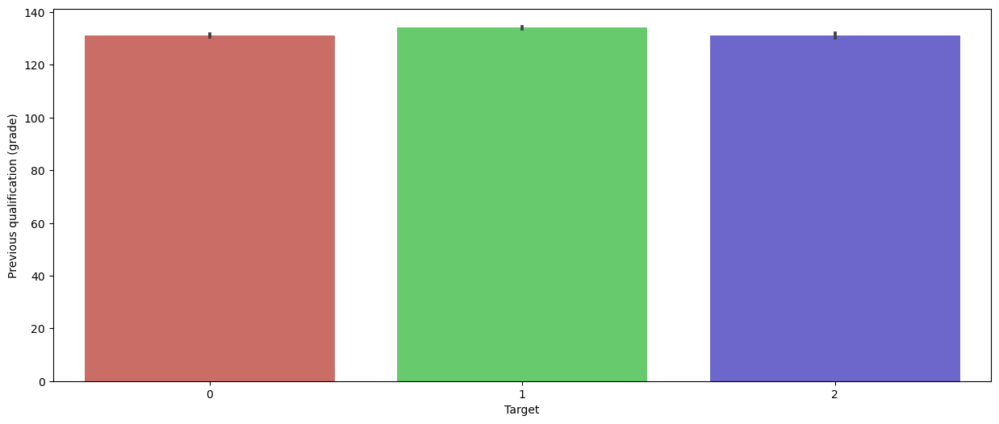

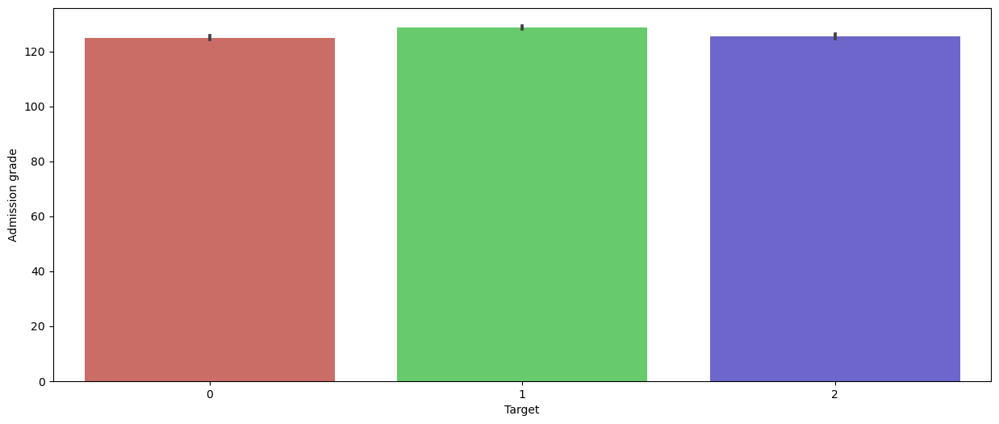

...

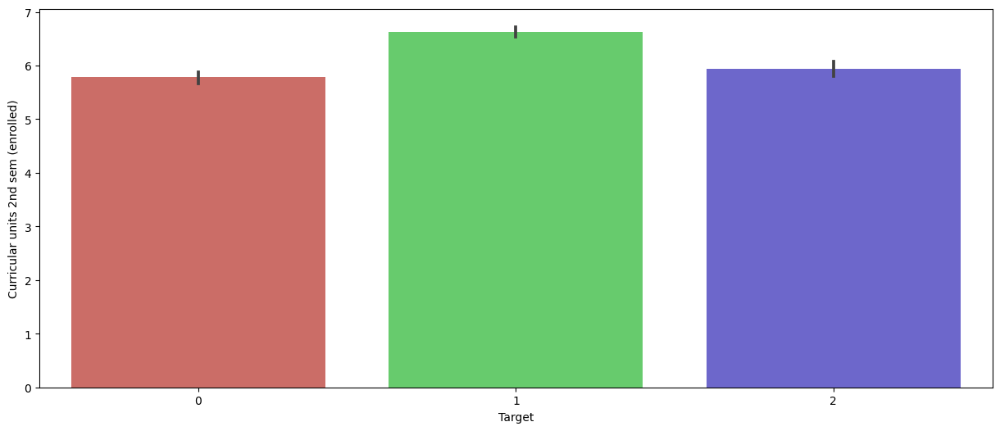

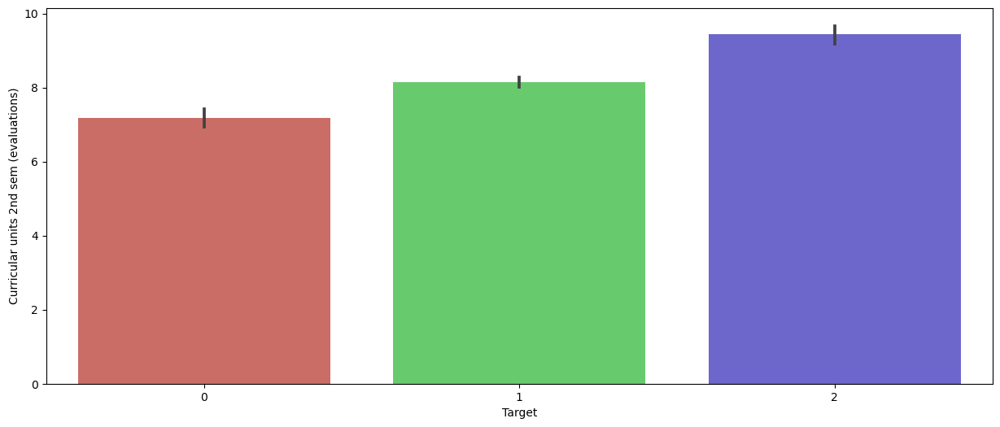

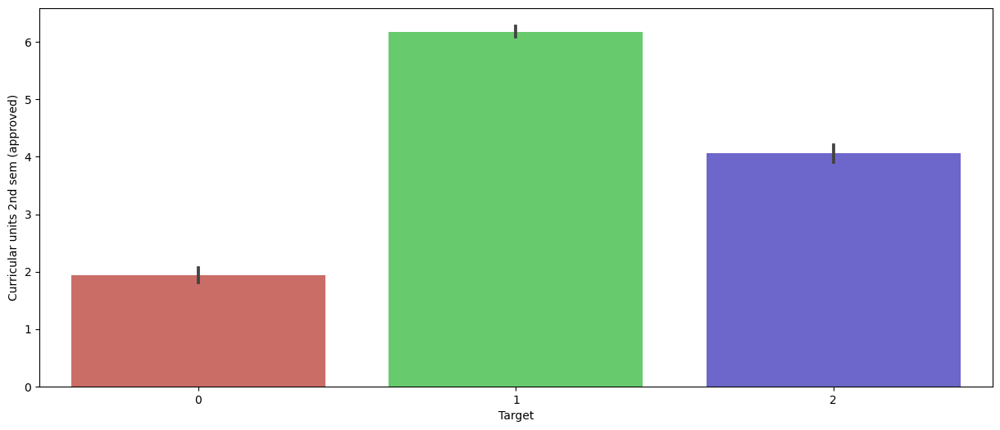

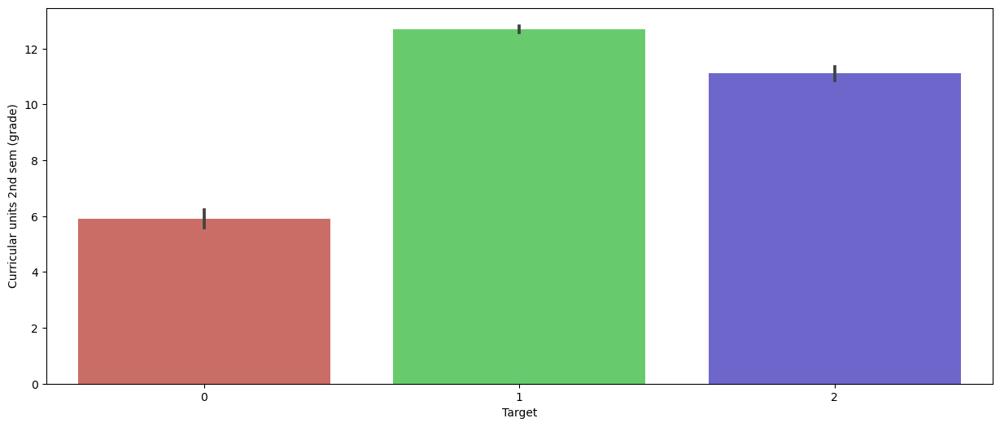

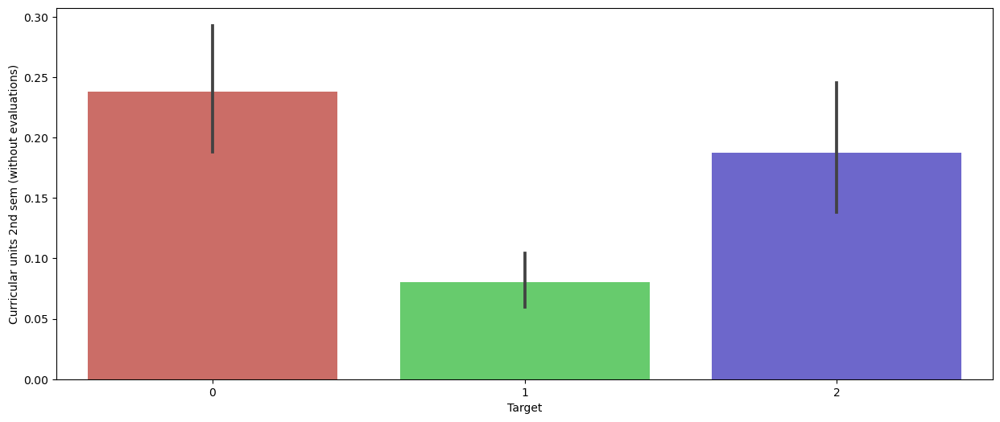

In [17]:
# Creating bar plots to visualize the relationship between the target variable (Target) and other features in dataset. 
# This is a good approach for understanding how different features might be related to the target variable.

df2 = df1.iloc[:, :-1] 
# Print column names for inspection
print(df2.columns)
for i in df2.columns:
  plt.figure(figsize=(15,6))
  sns.barplot(x = df1['Target'], y = df2[i], data = df1, palette = 'hls')
  plt.show()

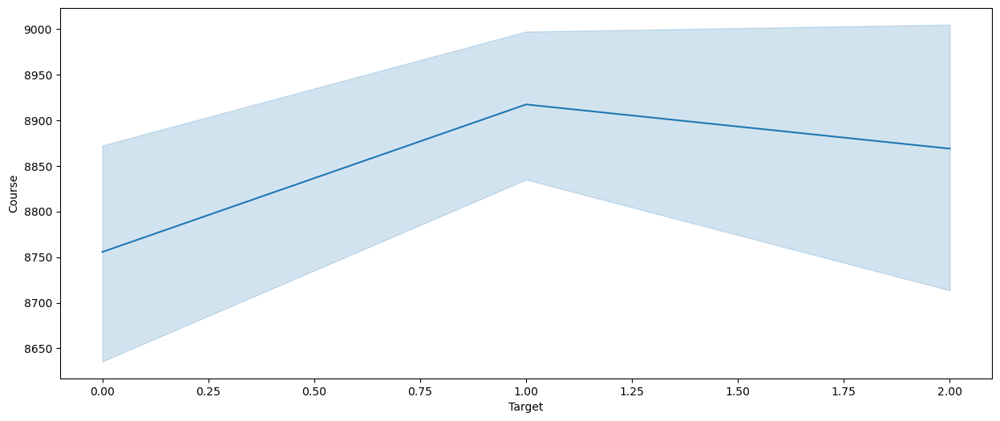

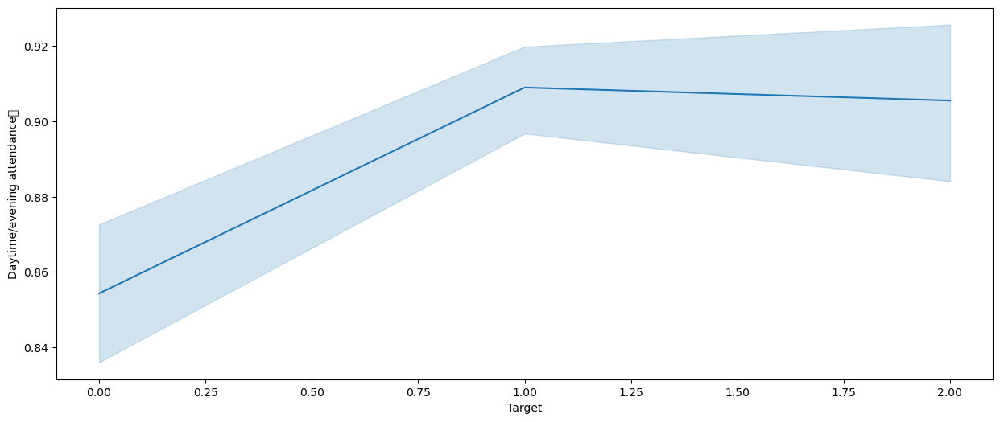

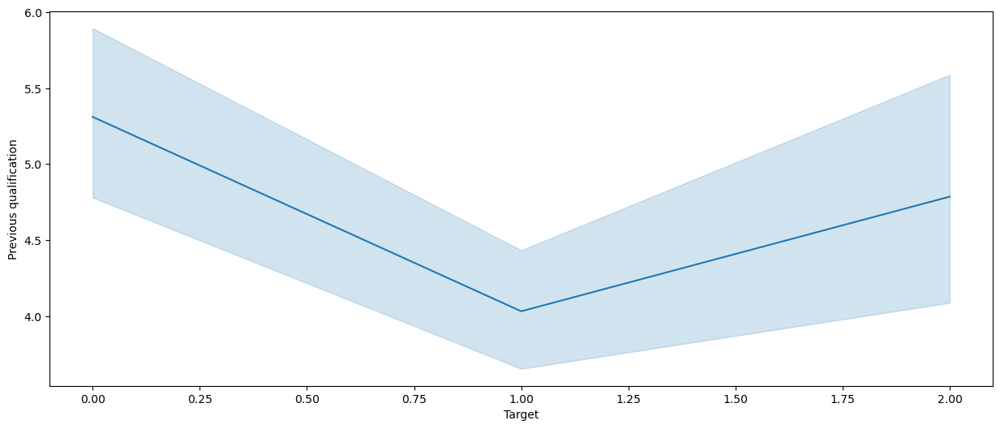

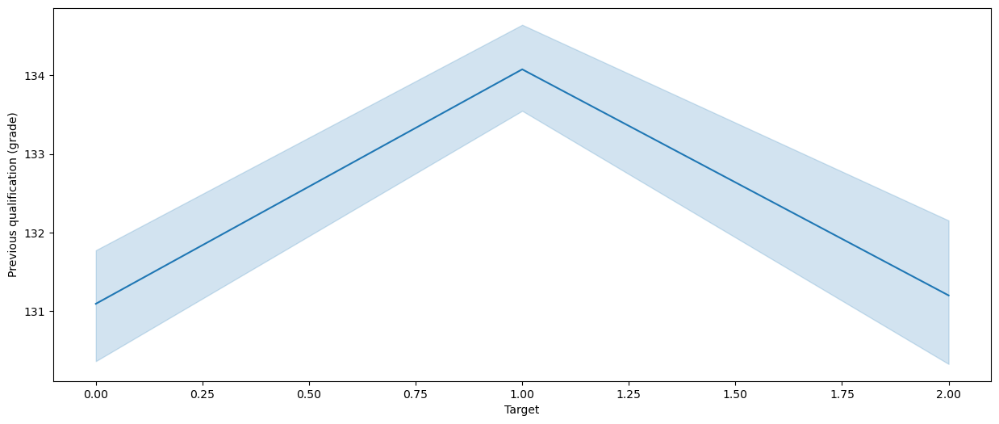

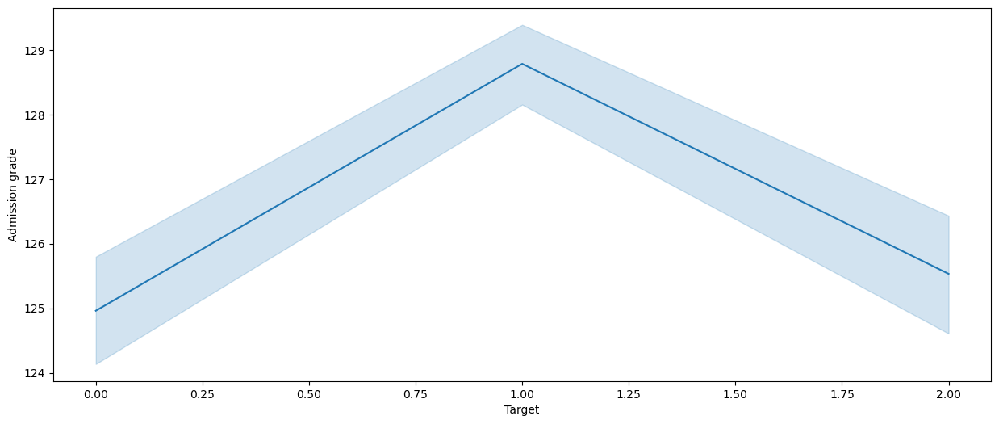

...

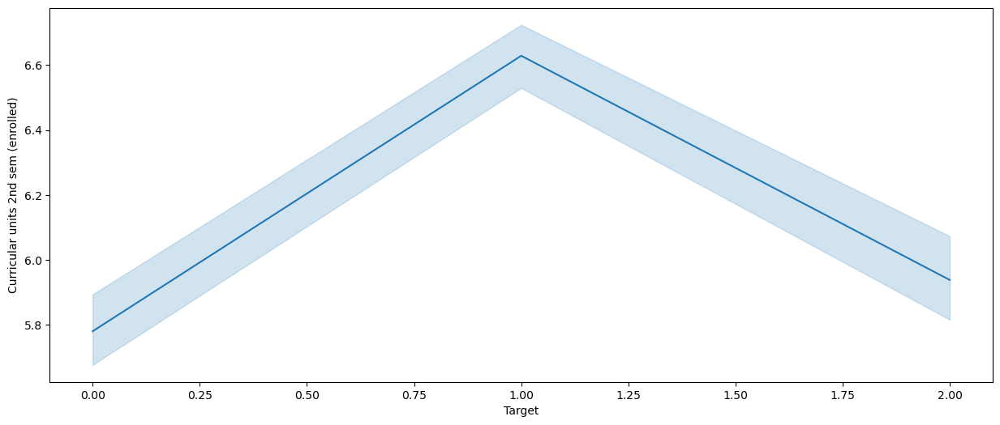

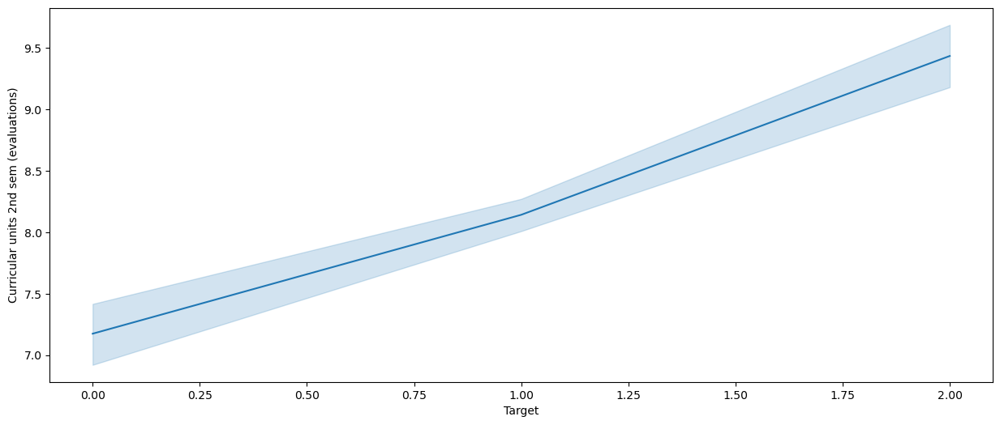

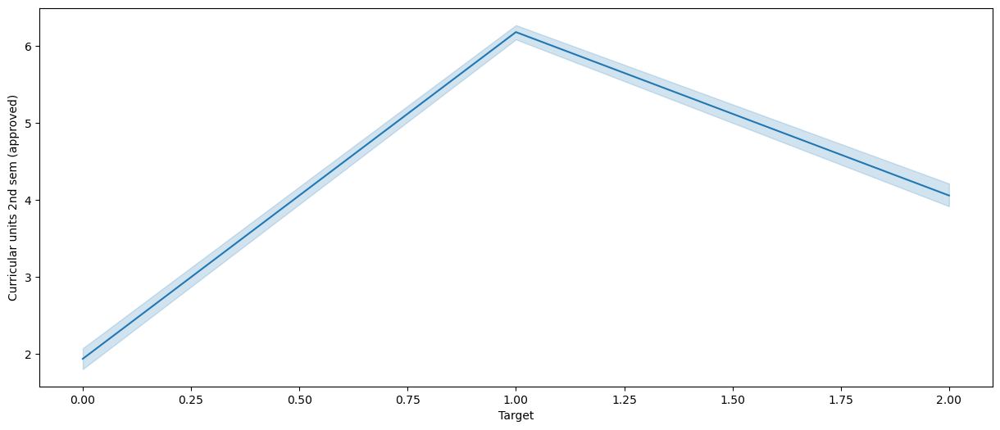

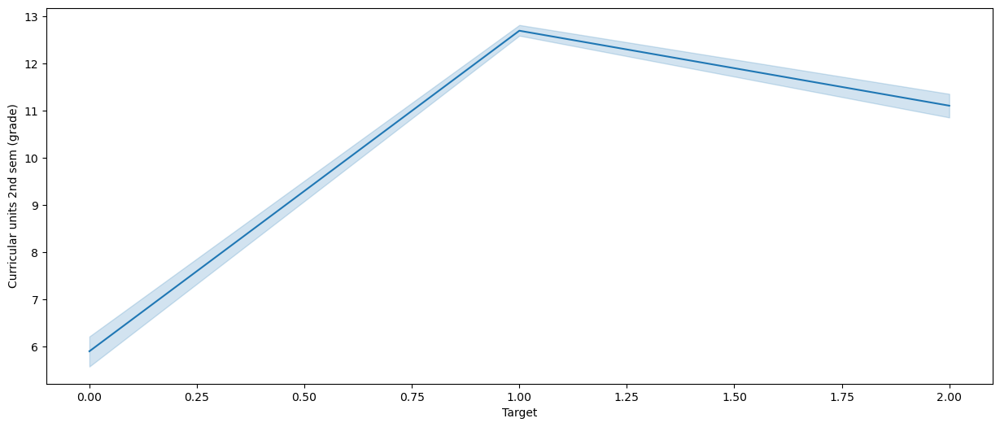

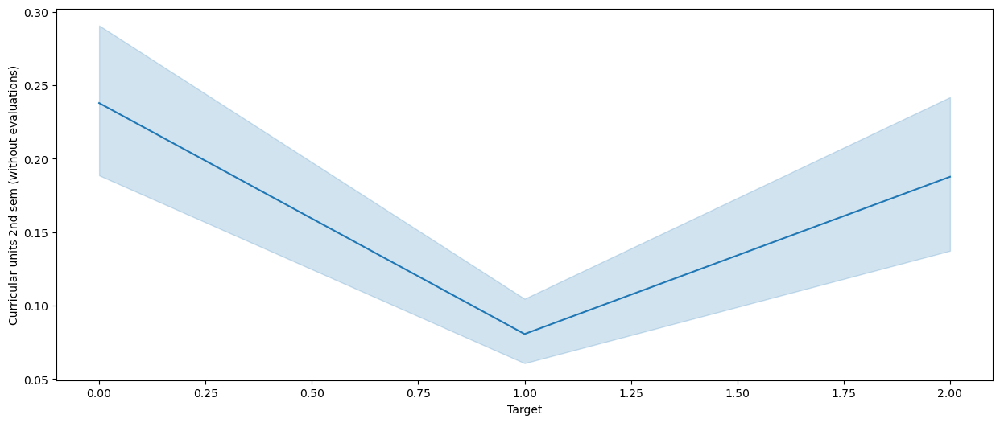

In [18]:
# Using line plots to visualize the relationship between the target variable (Target) and other features in dataset. 
# Line plots are typically used to show the trend or pattern of a variable over a continuous axis.
for i in df2.columns:
  plt.figure(figsize=(15,6))
  sns.lineplot(x = df1['Target'], y = df2[i], data = df1, palette = 'hls')
  plt.show()

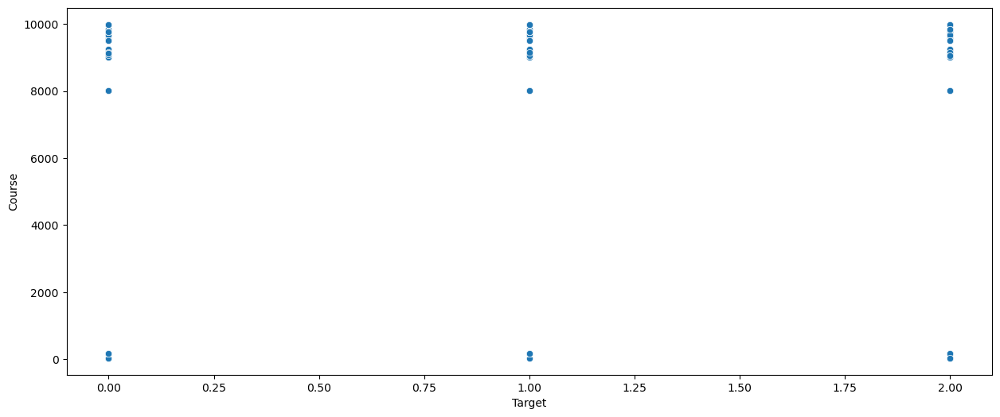

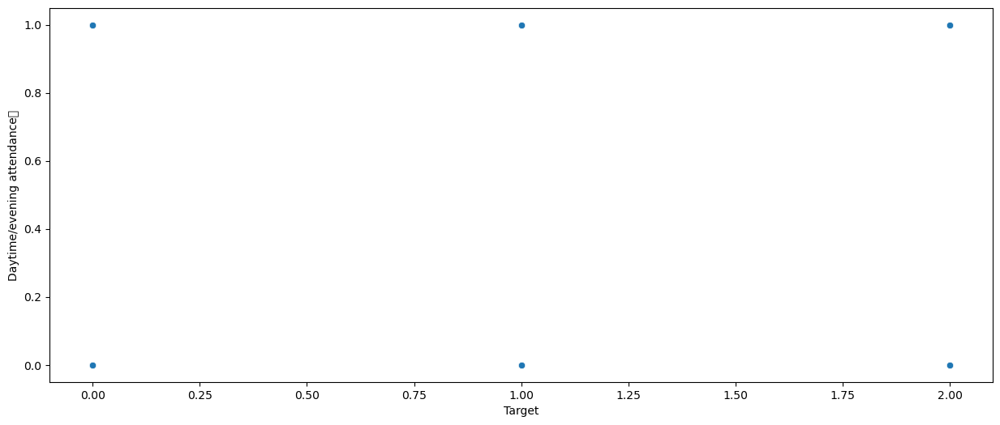

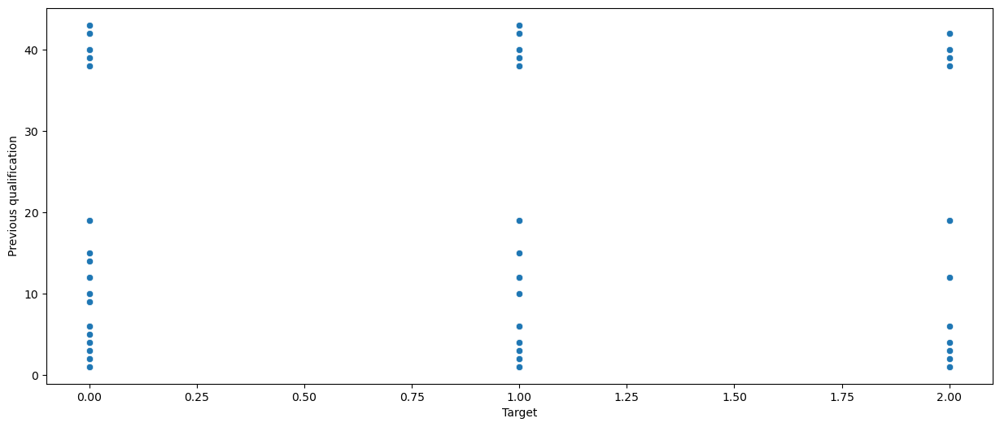

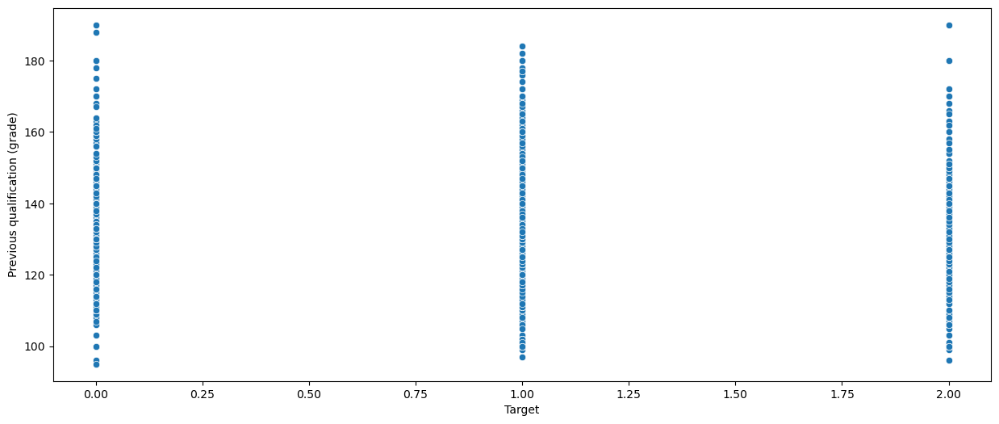

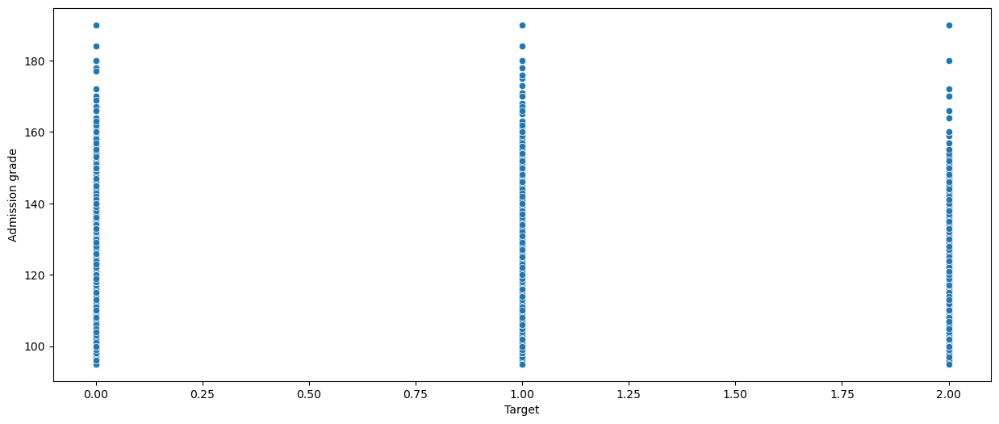

...

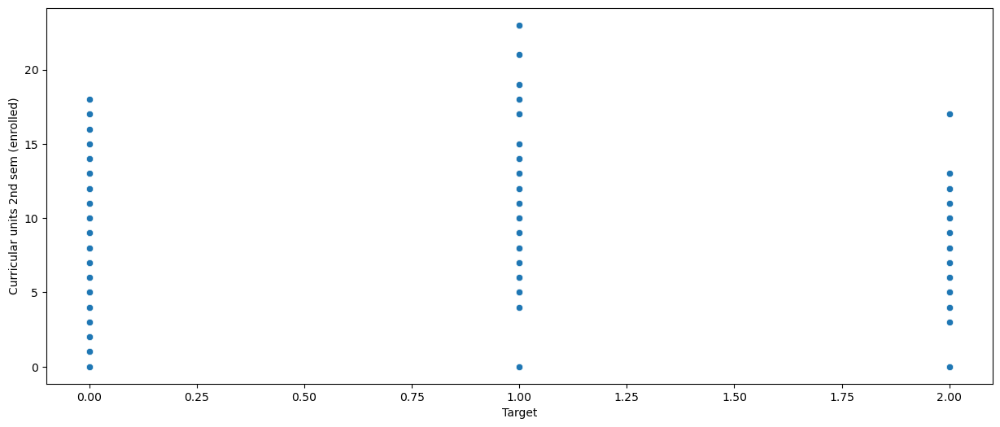

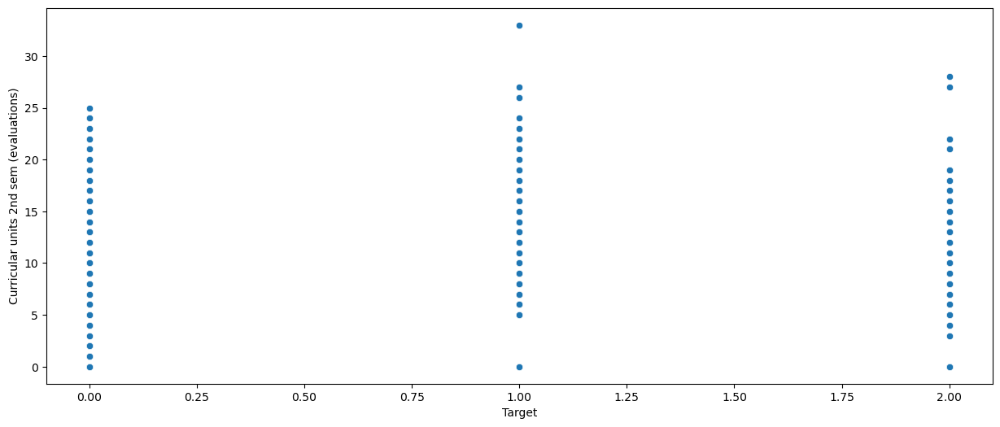

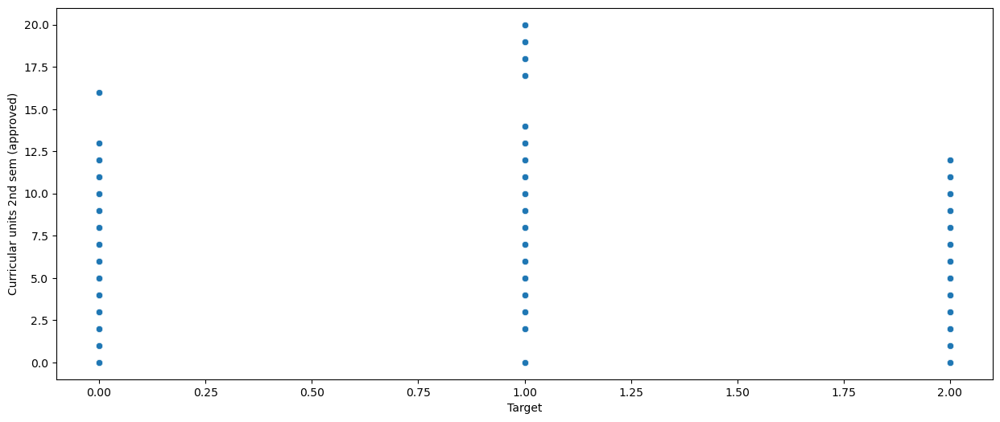

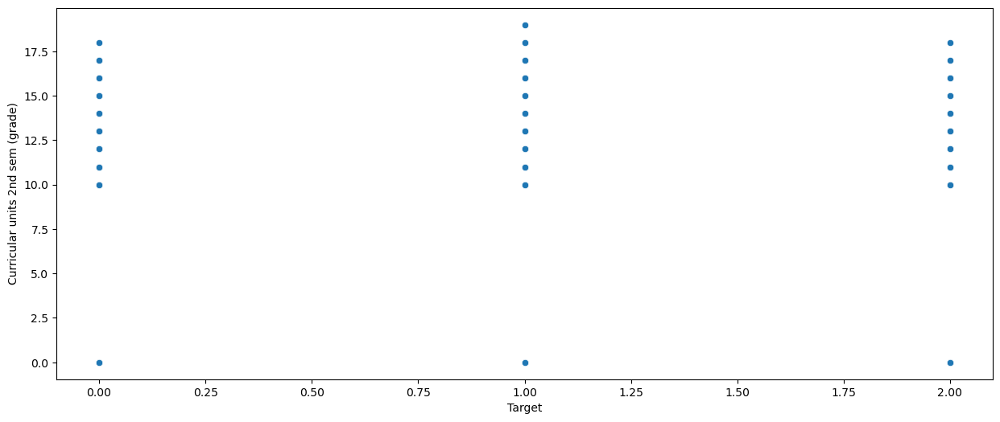

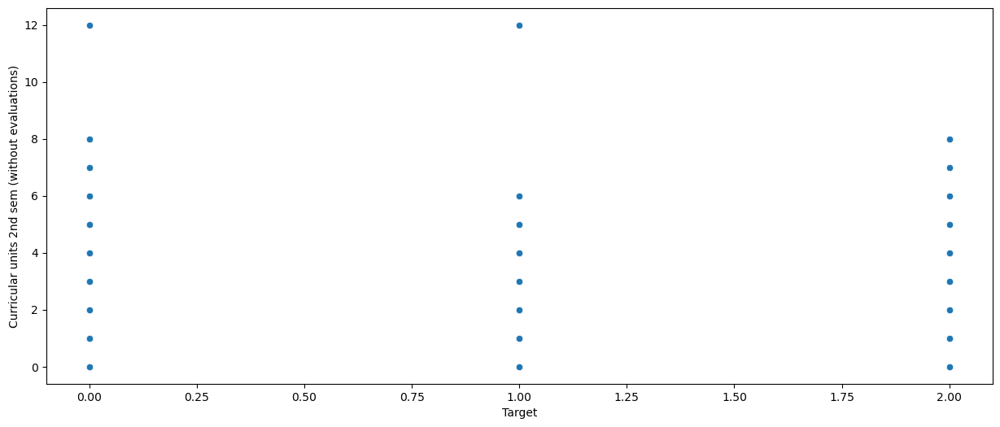

In [19]:
# using scatter plots to visualize the relationship between the target variable (Target) and other features in dataset.
# Scatter plots are useful for visualizing the distribution and relationship between two continuous variables.
for i in df2.columns:
  plt.figure(figsize=(15,6))
  sns.scatterplot(x = df1['Target'], y = df2[i], data = df1, palette = 'hls')
  plt.show()


<Figure size 1500x600 with 0 Axes>

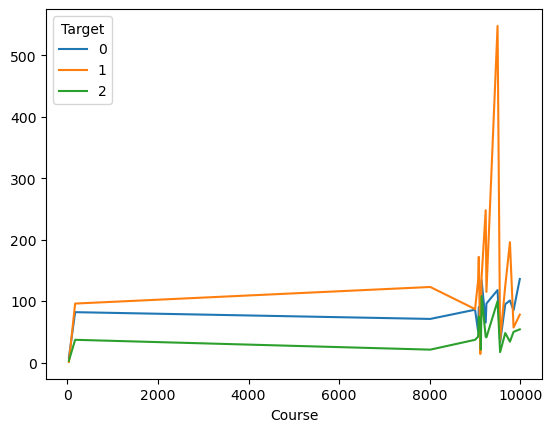

<Figure size 1500x600 with 0 Axes>

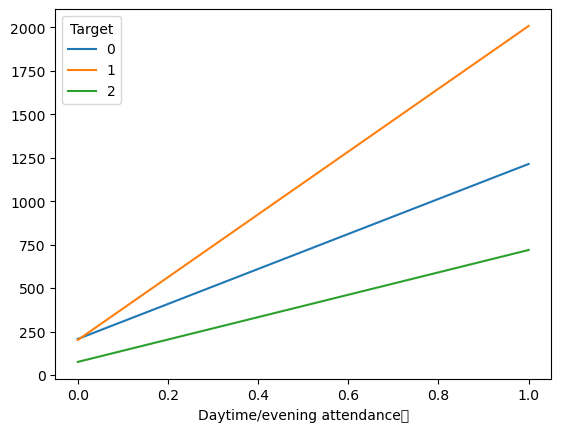

<Figure size 1500x600 with 0 Axes>

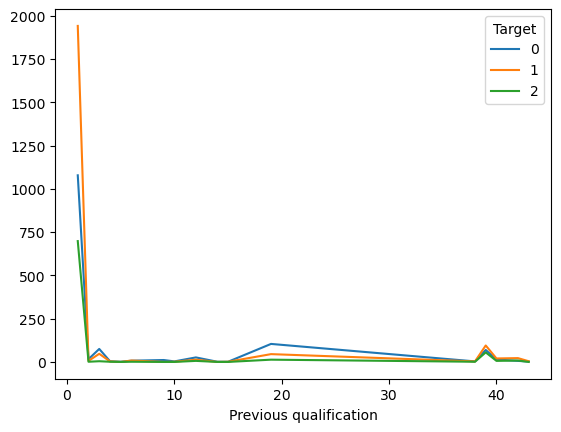

<Figure size 1500x600 with 0 Axes>

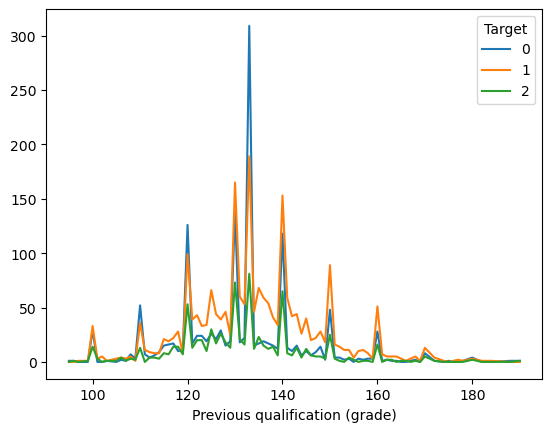

<Figure size 1500x600 with 0 Axes>

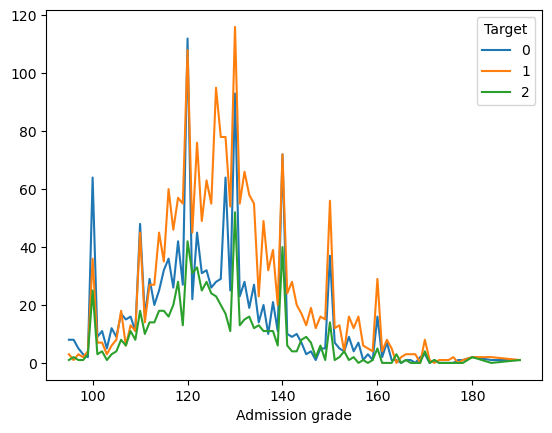

<Figure size 1500x600 with 0 Axes>

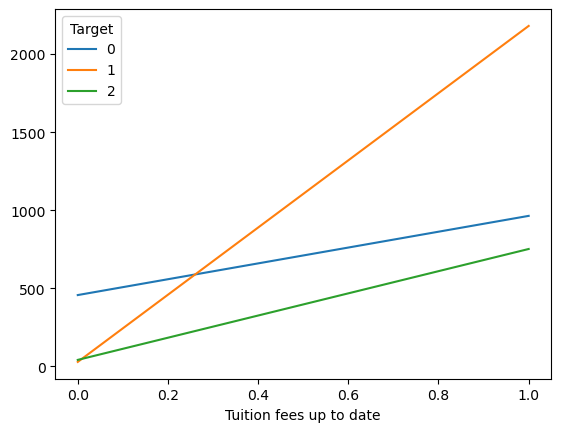

<Figure size 1500x600 with 0 Axes>

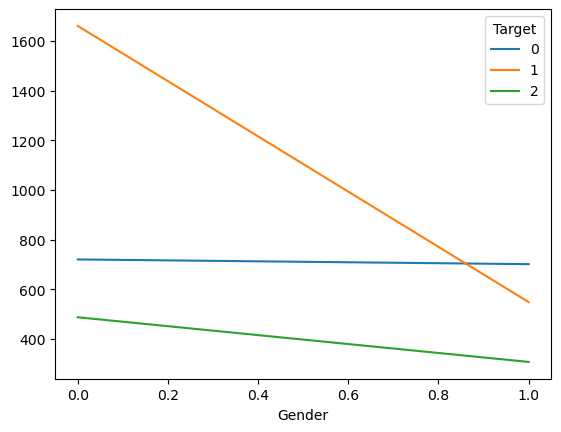

<Figure size 1500x600 with 0 Axes>

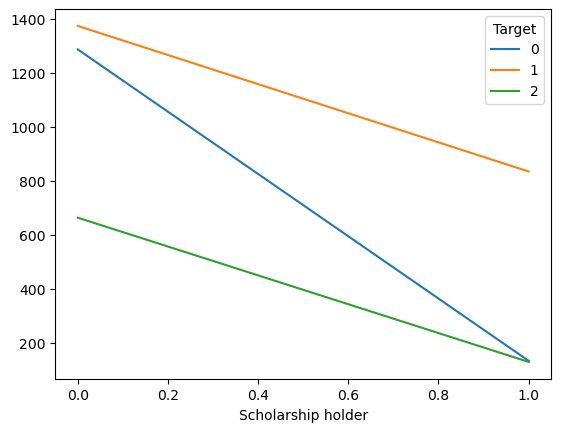

<Figure size 1500x600 with 0 Axes>

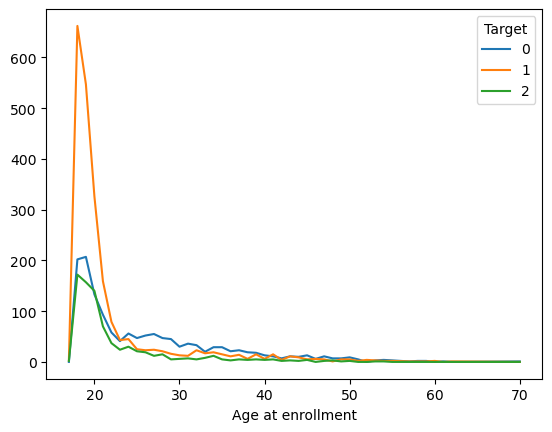

<Figure size 1500x600 with 0 Axes>

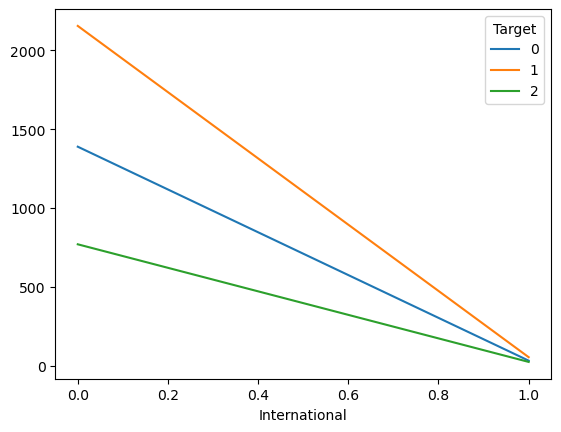

<Figure size 1500x600 with 0 Axes>

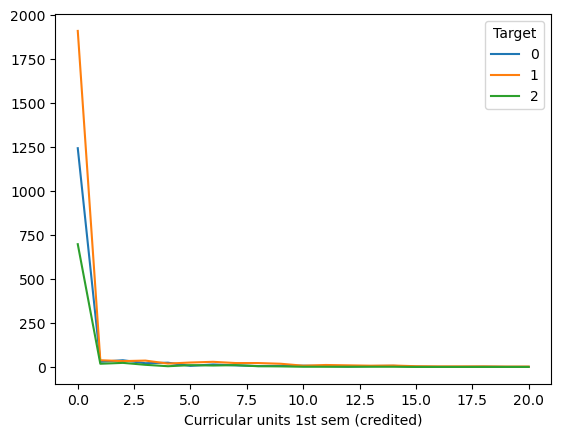

<Figure size 1500x600 with 0 Axes>

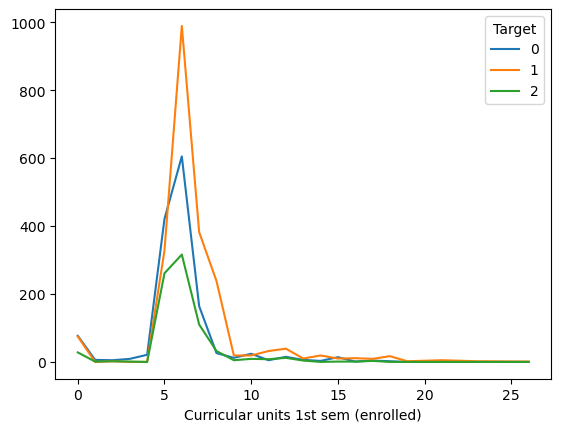

<Figure size 1500x600 with 0 Axes>

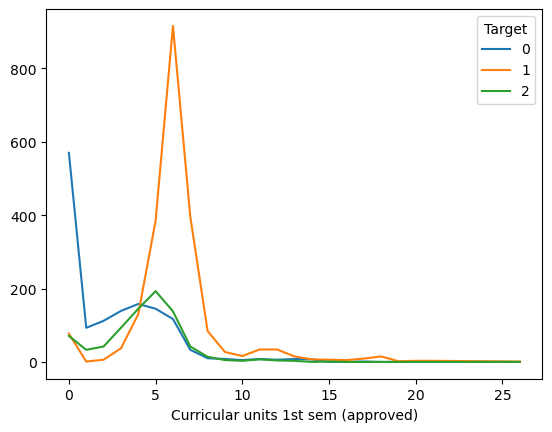

<Figure size 1500x600 with 0 Axes>

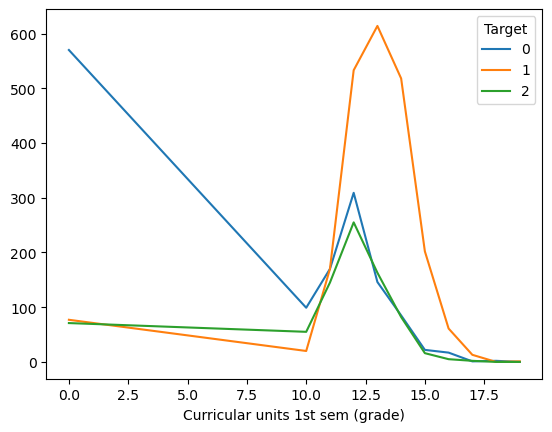

<Figure size 1500x600 with 0 Axes>

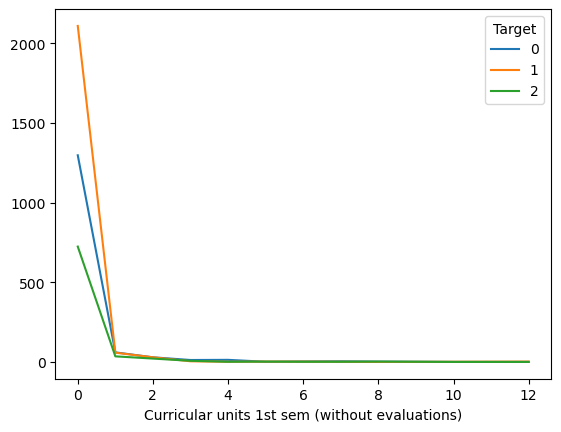

<Figure size 1500x600 with 0 Axes>

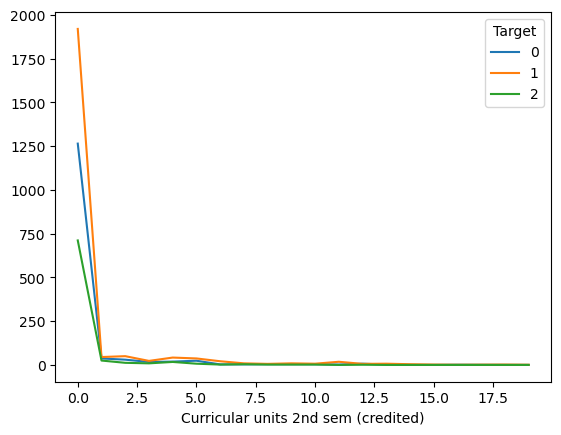

<Figure size 1500x600 with 0 Axes>

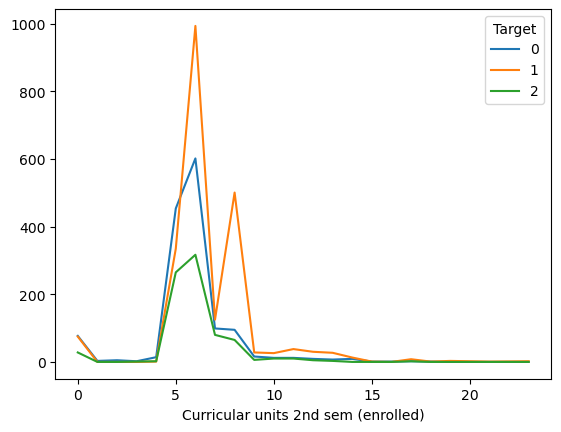

<Figure size 1500x600 with 0 Axes>

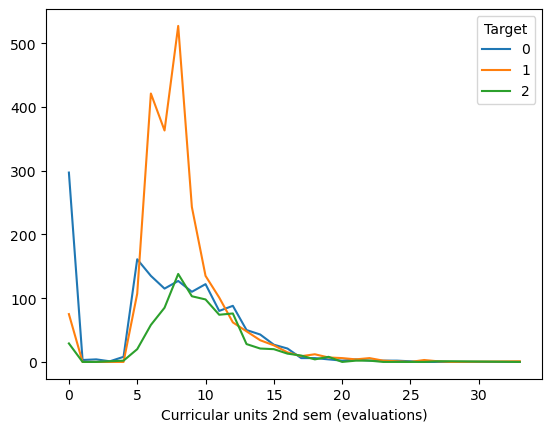

<Figure size 1500x600 with 0 Axes>

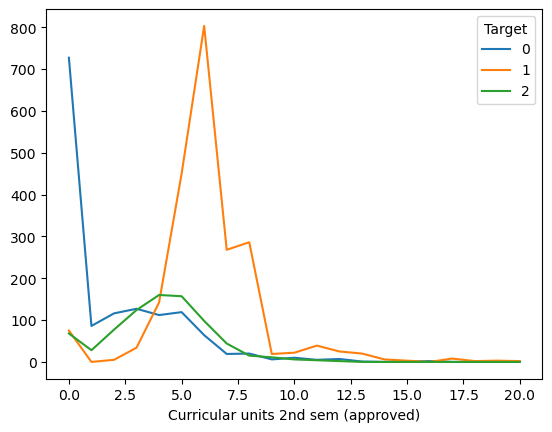

<Figure size 1500x600 with 0 Axes>

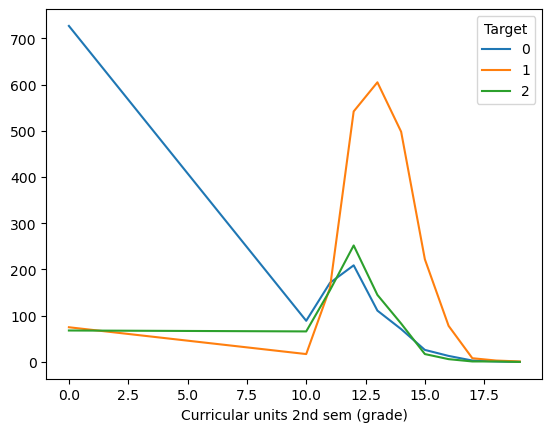

<Figure size 1500x600 with 0 Axes>

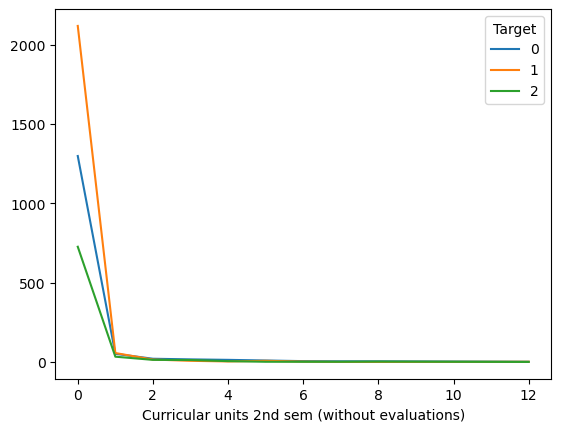

In [20]:
# creating line plots for cross-tabulations between each feature in df2 and the target variable Target.
# This can be a useful way to visualize the relationship between categorical variables and the target.
for i in df2.columns:
  plt.figure(figsize=(15,6))
  pd.crosstab(index=df2[i],columns=df1['Target']).plot(kind='line')
  plt.show()

In [21]:
df_corr = df1.corr()
df_corr

,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Admission grade,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,...,Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Target
Course,1.000000,-0.043151,0.006654,-0.081073,-0.125120,0.018381,-0.099571,0.017138,0.042994,-0.026737,...,0.180500,0.388551,0.034514,-0.089817,0.401539,0.278797,0.198032,0.347852,0.030816,0.024210
Daytime/evening attendance\t,-0.043151,1.000000,-0.071871,0.052926,0.008219,0.038799,-0.012326,0.093912,-0.462280,0.027973,...,0.016935,0.065506,0.045630,-0.111953,0.000371,0.014610,0.034022,0.050776,-0.004229,0.066439
Previous qualification,0.006654,-0.071871,1.000000,0.103792,0.184318,-0.068453,0.078684,-0.070513,0.156234,-0.026226,...,0.022020,0.000846,0.002887,0.143031,0.056179,0.114850,-0.008632,0.003527,0.005102,-0.027984
Previous qualification (grade),-0.081073,0.052926,0.103792,1.000000,0.581067,0.060857,-0.048033,0.056145,-0.112205,0.048303,...,0.048739,0.060965,-0.003963,-0.018421,-0.031591,-0.061337,0.050663,0.053656,-0.019093,0.025483
Admission grade,-0.125120,0.008219,0.184318,0.581067,1.000000,0.054069,0.008242,0.018786,-0.030139,0.025251,...,0.070729,0.073476,0.008792,0.039645,-0.042061,-0.057253,0.076354,0.073982,-0.013346,0.038623
Tuition fees up to date,0.018381,0.038799,-0.068453,0.060857,0.054069,1.000000,-0.104098,0.137421,-0.178099,-0.044202,...,0.239347,0.250434,-0.049775,0.014204,0.085918,0.063482,0.291921,0.295597,-0.071817,0.342121
Gender,-0.099571,-0.012326,0.078684,-0.048033,0.008242,-0.104098,1.000000,-0.169302,0.148835,-0.026415,...,-0.183829,-0.188145,-0.006302,0.018737,-0.124227,-0.041789,-0.224266,-0.198672,0.057223,-0.118454
Scholarship holder,0.017138,0.093912,-0.070513,0.056145,0.018786,0.137421,-0.169302,1.000000,-0.189917,-0.027972,...,0.153772,0.169613,-0.057770,-0.076480,0.026416,-0.021410,0.202704,0.181175,-0.048723,0.114517
Age at enrollment,0.042994,-0.462280,0.156234,-0.112205,-0.030139,-0.178099,0.148835,-0.189917,1.000000,-0.007111,...,-0.053405,-0.157763,0.057470,0.207561,0.085914,0.056286,-0.112052,-0.172978,0.061654,-0.201806
International,-0.026737,0.027973,-0.026226,0.048303,0.025251,-0.044202,-0.026415,-0.027972,-0.007111,1.000000,...,0.005290,0.006078,0.031222,0.002573,-0.013577,-0.004399,-0.010565,0.000991,-0.010660,0.015893
